# HMD Data Analysis
This notebook contains the analysis of Human Mortality Database (HMD) data to calculate the Mortality Rate Doubling Time (MRDT) for various countries.
We will load the data, process it, and visualize the results to understand the trends and differences between specified groups of countries and others.

## Imports
Importing necessary libraries for data processing and analysis.

In [87]:
import os
import pandas as pd
import numpy as np
from scipy.stats import linregress, ttest_ind
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.nonparametric.smoothers_lowess import lowess

## Load Data
Loading data from the specified directory containing the mortality rate files.

In [88]:
# Define the directory containing the txt files
directory = r'./hmd_data/hmd_statistics_2024-05-23/death_rates/Mx_1x1'

# Initialize list to store all results
all_results = []

# Define the correct column names
column_names = ['Year', 'Age', 'Female', 'Male', 'Total']

# Define the specified group countries
specified_countries = [
    'FRATNP', 'BEL', 'LUX', 'DEUTNP', 'NLD', 'AUT', 'IRL', 'CHE', 
    'GBR_NP', 'ITA', 'DNK', 'ESP', 'PRT', 'ISL', 'NOR', 'USA', 
    'CAN', 'AUS', 'NZL_NP', 'JPN'
]

## Function Definitions
Defining functions to calculate MRDT and process data for each country.

In [89]:
# Function to calculate MRDT for a specific age range and mortality rates
def calculate_mrdt(age_range, mortality_rates):
    # Filter out zero or negative mortality rates
    valid_indices = mortality_rates > 0
    valid_age_range = age_range.loc[valid_indices].copy()
    valid_mortality_rates = mortality_rates[valid_indices]
    
    if len(valid_age_range) == 0:
        return np.nan  # Return NaN if no valid data points are available
    
    valid_age_range.loc[:, 'log_Mx'] = np.log(valid_mortality_rates)
    slope, intercept, r_value, p_value, std_err = linregress(valid_age_range['Age'], valid_age_range['log_Mx'])
    beta = slope
    return np.log(2) / beta


# Function to calculate MRDT for a specific country file
def calculate_mrdt_for_country(file_path, country_code):
    # Load the data with the correct column names and skip the first two rows
    data = pd.read_csv(file_path, sep='\\s+', names=column_names, skiprows=2)
    
    # Convert 'Age', 'Female', 'Male', and 'Total' columns to numeric types
    data['Age'] = pd.to_numeric(data['Age'], errors='coerce')
    data['Female'] = pd.to_numeric(data['Female'], errors='coerce')
    data['Male'] = pd.to_numeric(data['Male'], errors='coerce')
    data['Total'] = pd.to_numeric(data['Total'], errors='coerce')
    
    # Drop rows with missing values
    data.dropna(subset=['Age', 'Female', 'Male', 'Total'], inplace=True)

    # Initialize a list to store the results for the country
    country_results = []

    # Iterate through each year in the dataset
    for year in data['Year'].unique():
        # Filter data for the specific year and age range (20 to 70)
        year_data = data.loc[(data['Year'] == year) & (data['Age'] >= 20) & (data['Age'] <= 110)].copy()
        
        # Calculate MRDT for females, males, and total
        mrdt_female = calculate_mrdt(year_data[['Age']], year_data['Female'])
        mrdt_male = calculate_mrdt(year_data[['Age']], year_data['Male'])
        mrdt_total = calculate_mrdt(year_data[['Age']], year_data['Total'])
        
        # Append the results with country code
        country_results.append({'Country': country_code, 'Year': year, 'MRDT_Female': mrdt_female, 'MRDT_Male': mrdt_male, 'MRDT_Total': mrdt_total})
    
    return country_results

## Data Processing
Processing each file in the directory and calculating MRDT.

In [90]:
# Load data for specified countries and randomly selected other countries
other_countries = []
all_files = os.listdir(directory)


In [91]:
# Filter out the specified countries and randomly sample the same number of other countries
specified_files = [f for f in all_files if f.split('-')[0] in specified_countries]
other_files = [f for f in all_files if f.split('-')[0] not in specified_countries]
sampled_other_files = np.random.choice(other_files, len(specified_files), replace=False)

# Process each file in the directory
for filename in specified_files + list(sampled_other_files):
    if filename.endswith(".txt"):
        country_code = filename.split('-')[0]  # Extract country code from filename (before the hyphen)
        file_path = os.path.join(directory, filename)
        country_results = calculate_mrdt_for_country(file_path, country_code)
        if country_results:
            all_results.extend(country_results)

# Convert all results to a DataFrame for easier viewing
all_results_df = pd.DataFrame(all_results)

## Filtering Data
Filtering out specified countries from the results.

In [92]:
# List of country codes to drop
drop_countries = ['NZL_MA', 'NZL_NM', 'GBRCENW', 'GBRTENW', 'GBR_NIR', 'GBR_SCO', 'DEUTE', 'DEUTW', 'FRACNP']

# Drop rows with the specified country codes
filtered_results_df = all_results_df[~all_results_df['Country'].isin(drop_countries)]

In [93]:
# Convert 'Year' to numeric
all_results_df['Year'] = pd.to_numeric(all_results_df['Year'], errors='coerce')

# Drop the years before 1820
all_results_df = all_results_df[all_results_df['Year'] >= 1820]

# Verify the filtering
print(all_results_df['Year'].min(), all_results_df['Year'].max())

1820 2023


In [94]:
# Split the DataFrame into specified and other groups
specified_group_df = all_results_df[all_results_df['Country'].isin(specified_countries)]
other_group_df = all_results_df[~all_results_df['Country'].isin(specified_countries)]


In [95]:
specified_group_df

,Country,Year,MRDT_Female,MRDT_Male,MRDT_Total
0,AUS,1921,10.292171,10.832710,10.601896
1,AUS,1922,10.067625,10.061659,10.037259
2,AUS,1923,9.916260,10.074425,10.135118
3,AUS,1924,9.741479,10.118925,10.116418
4,AUS,1925,9.768675,10.141951,10.328338
...,...,...,...,...,...
2373,USA,2017,7.996007,8.975571,8.622453
2374,USA,2018,7.981048,8.902953,8.592392
2375,USA,2019,8.012191,8.981405,8.643455
2376,USA,2020,8.043598,9.079990,8.721675


## Calculating Year-over-Year Changes
Calculating the year-over-year changes in MRDT for females, males, and the total population.

In [96]:
# Sort the DataFrame by Country and Year
all_results_df = all_results_df.sort_values(by=['Country', 'Year'])

# Calculate the year-over-year change for MRDT_Female, MRDT_Male, and MRDT_Total
all_results_df['MRDT_Female_Change'] = all_results_df.groupby('Country')['MRDT_Female'].diff()
all_results_df['MRDT_Male_Change'] = all_results_df.groupby('Country')['MRDT_Male'].diff()
all_results_df['MRDT_Total_Change'] = all_results_df.groupby('Country')['MRDT_Total'].diff()

# Create a new DataFrame to store the results for MRDT change by year
mrdt_change_df = all_results_df[['Country', 'Year', 'MRDT_Female_Change', 'MRDT_Male_Change', 'MRDT_Total_Change']]

## Analysis
Performing analysis on specified and other groups of countries.

In [97]:
# Calculate percentage changes for MRDT values
specified_group_df.loc[:, 'MRDT_Female_Change'] = specified_group_df['MRDT_Female'].pct_change()
specified_group_df.loc[:, 'MRDT_Male_Change'] = specified_group_df['MRDT_Male'].pct_change()
specified_group_df.loc[:, 'MRDT_Total_Change'] = specified_group_df['MRDT_Total'].pct_change()

other_group_df.loc[:, 'MRDT_Female_Change'] = other_group_df['MRDT_Female'].pct_change()
other_group_df.loc[:, 'MRDT_Male_Change'] = other_group_df['MRDT_Male'].pct_change()
other_group_df.loc[:, 'MRDT_Total_Change'] = other_group_df['MRDT_Total'].pct_change()

# Calculate mean MRDT and MRDT change for both groups
mean_mrdt_specified = specified_group_df[['MRDT_Female', 'MRDT_Male', 'MRDT_Total']].mean()
mean_mrdt_other = other_group_df[['MRDT_Female', 'MRDT_Male', 'MRDT_Total']].mean()

mean_mrdt_change_specified = specified_group_df[['MRDT_Female_Change', 'MRDT_Male_Change', 'MRDT_Total_Change']].mean()
mean_mrdt_change_other = other_group_df[['MRDT_Female_Change', 'MRDT_Male_Change', 'MRDT_Total_Change']].mean()

# Perform t-tests to compare the differences between the two groups
ttest_results_female = ttest_ind(specified_group_df['MRDT_Female'].dropna(), other_group_df['MRDT_Female'].dropna())
ttest_results_male = ttest_ind(specified_group_df['MRDT_Male'].dropna(), other_group_df['MRDT_Male'].dropna())
ttest_results_total = ttest_ind(specified_group_df['MRDT_Total'].dropna(), other_group_df['MRDT_Total'].dropna())

ttest_results_female_change = ttest_ind(specified_group_df['MRDT_Female_Change'].dropna(), other_group_df['MRDT_Female_Change'].dropna())
ttest_results_male_change = ttest_ind(specified_group_df['MRDT_Male_Change'].dropna(), other_group_df['MRDT_Male_Change'].dropna())
ttest_results_total_change = ttest_ind(specified_group_df['MRDT_Total_Change'].dropna(), other_group_df['MRDT_Total_Change'].dropna())

# Display the results
results = {
    'Mean MRDT Specified': mean_mrdt_specified,
    'Mean MRDT Other': mean_mrdt_other,
    'Mean MRDT Change Specified': mean_mrdt_change_specified,
    'Mean MRDT Change Other': mean_mrdt_change_other,
    'T-test MRDT Female': ttest_results_female,
    'T-test MRDT Male': ttest_results_male,
    'T-test MRDT Total': ttest_results_total,
    'T-test MRDT Change Female': ttest_results_female_change,
    'T-test MRDT Change Male': ttest_results_male_change,
    'T-test MRDT Change Total': ttest_results_total_change,
}

# Print the results
for key, value in results.items():
    print(f"{key}: {value}")

Mean MRDT Specified: MRDT_Female    8.713076
MRDT_Male      9.199237
MRDT_Total     9.101370
dtype: float64
Mean MRDT Other: MRDT_Female    8.490702
MRDT_Male      9.153114
MRDT_Total     9.008886
dtype: float64
Mean MRDT Change Specified: MRDT_Female_Change    0.001901
MRDT_Male_Change      0.002330
MRDT_Total_Change     0.001734
dtype: float64
Mean MRDT Change Other: MRDT_Female_Change    0.00126
MRDT_Male_Change      0.00128
MRDT_Total_Change     0.00104
dtype: float64
T-test MRDT Female: TtestResult(statistic=3.7815277762951256, pvalue=0.00015815551448174125, df=3981.0)
T-test MRDT Male: TtestResult(statistic=0.8537785848293308, pvalue=0.39327905135956465, df=3981.0)
T-test MRDT Total: TtestResult(statistic=1.6944843970157573, pvalue=0.0902514882504176, df=3981.0)
T-test MRDT Change Female: TtestResult(statistic=0.304579056331323, pvalue=0.760702701702245, df=3979.0)
T-test MRDT Change Male: TtestResult(statistic=0.4871534769173128, pvalue=0.6261764068019662, df=3979.0)
T-test MRDT

## Visualization
Visualizing the year-over-year MRDT changes and trends.

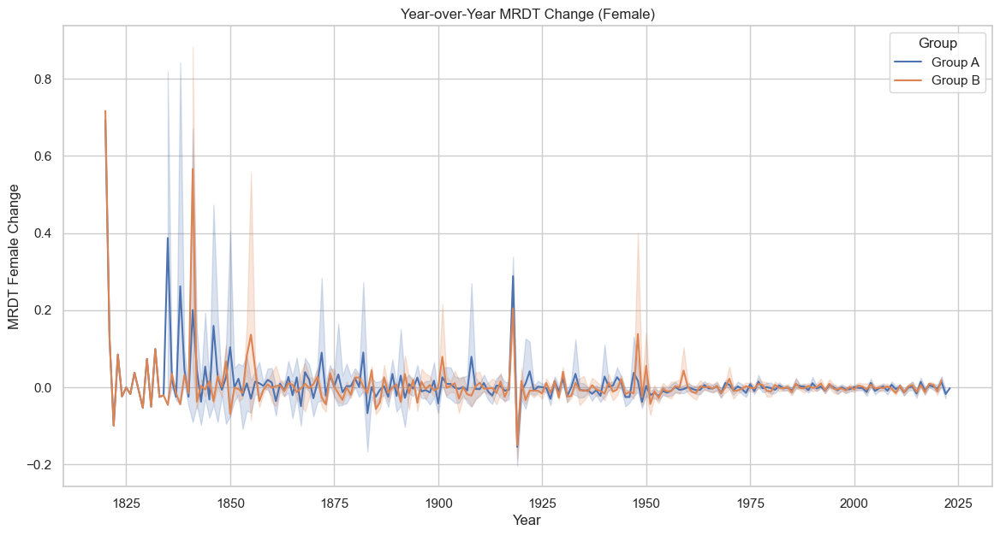

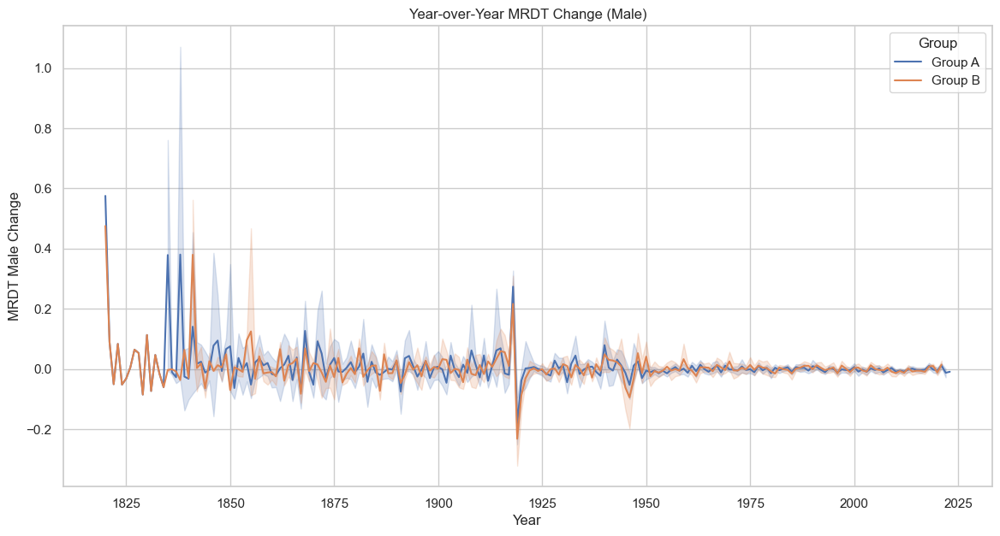

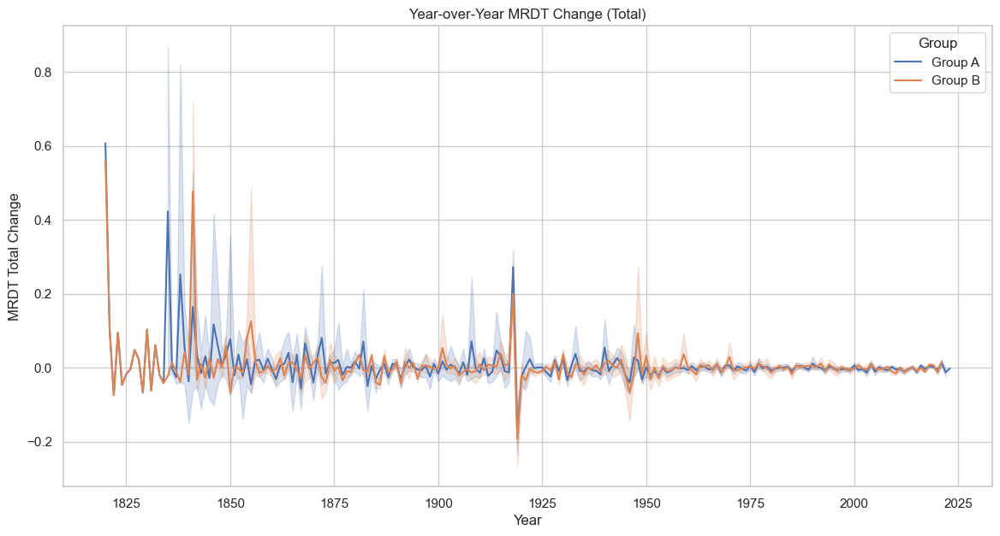

In [101]:
# Prepare the data
specified_group_df['Group'] = 'Group A'
other_group_df['Group'] = 'Group B'
combined_df = pd.concat([specified_group_df, other_group_df])

# Set the plot style
sns.set(style="whitegrid")

# Plot MRDT changes for females
plt.figure(figsize=(14, 7))
sns.lineplot(data=combined_df, x='Year', y='MRDT_Female_Change', hue='Group')
plt.title('Year-over-Year MRDT Change (Female)')
plt.xlabel('Year')
plt.ylabel('MRDT Female Change')
plt.legend(title='Group')
plt.show()

# Plot MRDT changes for males
plt.figure(figsize=(14, 7))
sns.lineplot(data=combined_df, x='Year', y='MRDT_Male_Change', hue='Group')
plt.title('Year-over-Year MRDT Change (Male)')
plt.xlabel('Year')
plt.ylabel('MRDT Male Change')
plt.legend(title='Group')
plt.show()

# Plot MRDT changes for total population
plt.figure(figsize=(14, 7))
sns.lineplot(data=combined_df, x='Year', y='MRDT_Total_Change', hue='Group')
plt.title('Year-over-Year MRDT Change (Total)')
plt.xlabel('Year')
plt.ylabel('MRDT Total Change')
plt.legend(title='Group')
plt.show()

## Trends and Summary Statistics
Analyzing trends and calculating summary statistics for MRDT.

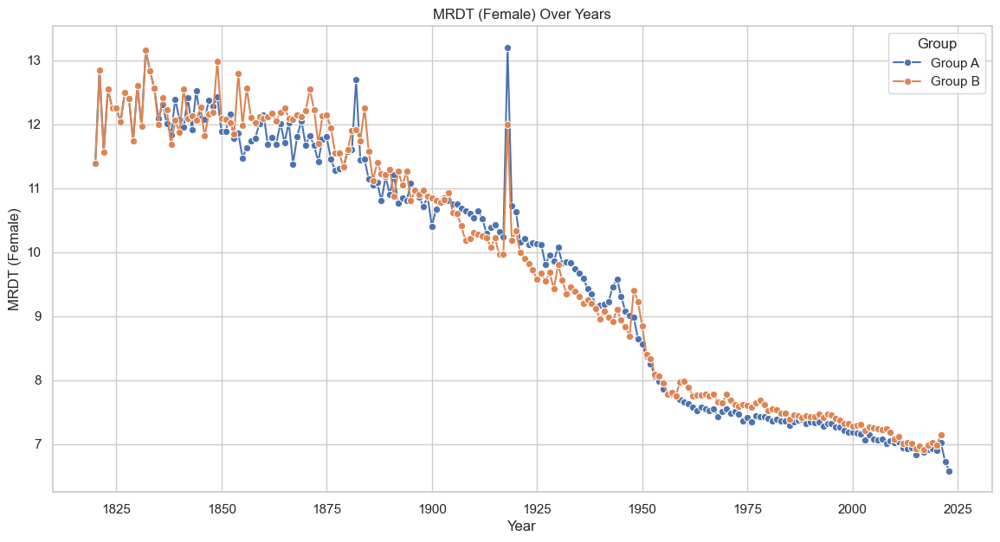

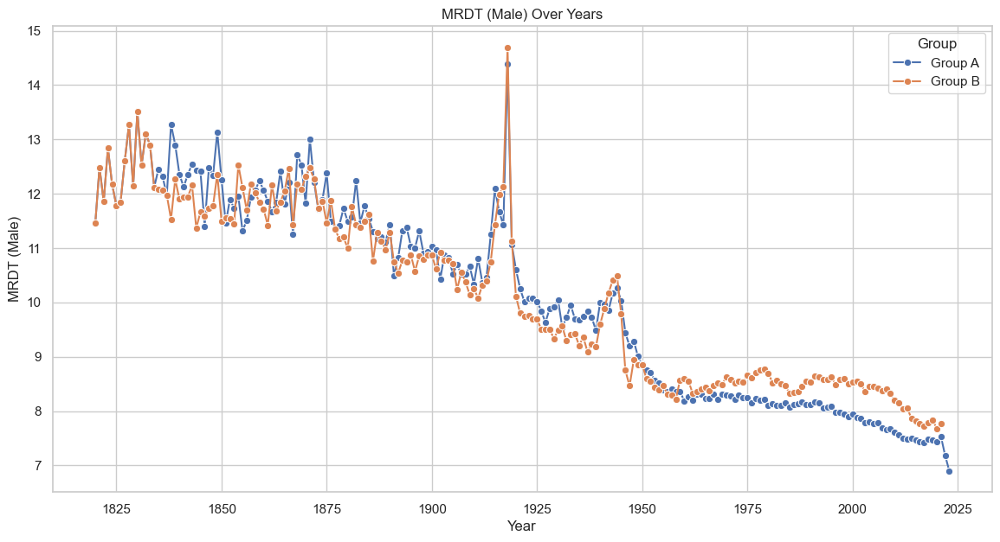

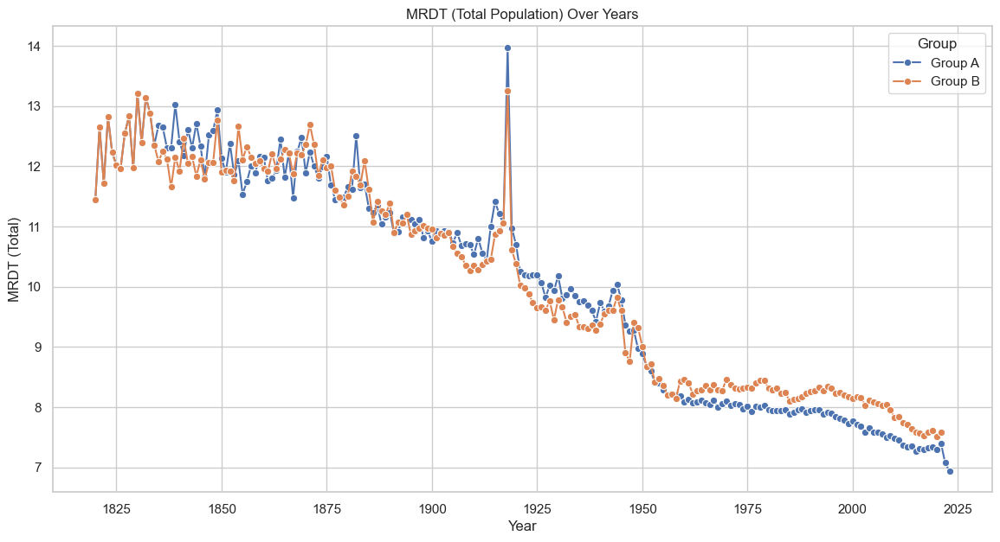

In [100]:
def calculate_statistics(df):
    stats = df.groupby('Year').agg({
        'MRDT_Female': ['mean', 'median'],
        'MRDT_Male': ['mean', 'median'],
        'MRDT_Total': ['mean', 'median'],
    })
    stats.columns = ['_'.join(col).strip() for col in stats.columns.values]
    return stats.reset_index()

mean_mrdt_specified_by_year = calculate_statistics(specified_group_df)
mean_mrdt_other_by_year = calculate_statistics(other_group_df)

# Merge the data for plotting
mean_mrdt_specified_by_year['Group'] = 'Group A'
mean_mrdt_other_by_year['Group'] = 'Group B'
combined_mean_mrdt = pd.concat([mean_mrdt_specified_by_year, mean_mrdt_other_by_year])

# Helper function to plot mean MRDT
def plot_mean_mrdt(data, value_column_mean, title, ylabel):
    plt.figure(figsize=(14, 7))
    
    # Plot mean MRDT
    sns.lineplot(data=data, x='Year', y=value_column_mean, hue='Group', marker='o', linestyle='-')
    
    plt.title(title)
    plt.xlabel('Year')
    plt.ylabel(ylabel)
    plt.legend(title='Group')
    plt.show()

# Plot mean MRDT for females
plot_mean_mrdt(combined_mean_mrdt, 'MRDT_Female_mean', 'MRDT (Female) Over Years', 'MRDT (Female)')

# Plot mean MRDT for males
plot_mean_mrdt(combined_mean_mrdt, 'MRDT_Male_mean', 'MRDT (Male) Over Years', 'MRDT (Male)')

# Plot mean MRDT for total population
plot_mean_mrdt(combined_mean_mrdt, 'MRDT_Total_mean', 'MRDT (Total Population) Over Years', 'MRDT (Total)')

Mean MRDT from 1820 to 1900:
           MRDT_Female  MRDT_Male  MRDT_Total
Group                                        
Other        11.765134  11.580686   11.771448
Specified    11.563842  11.743362   11.750997
P-values from 1820 to 1900:
MRDT_Female: 0.00498
MRDT_Male: 0.10071
MRDT_Total: 0.80145


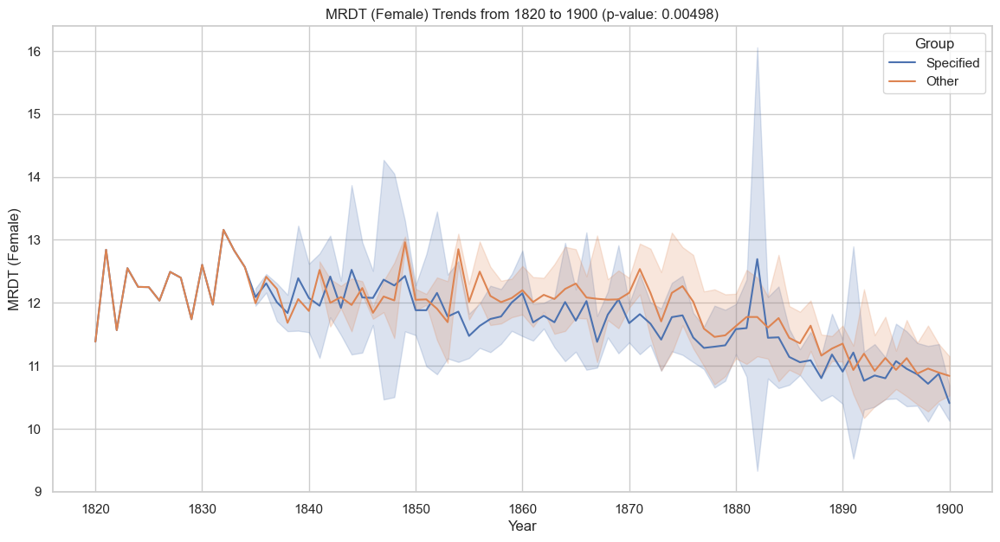

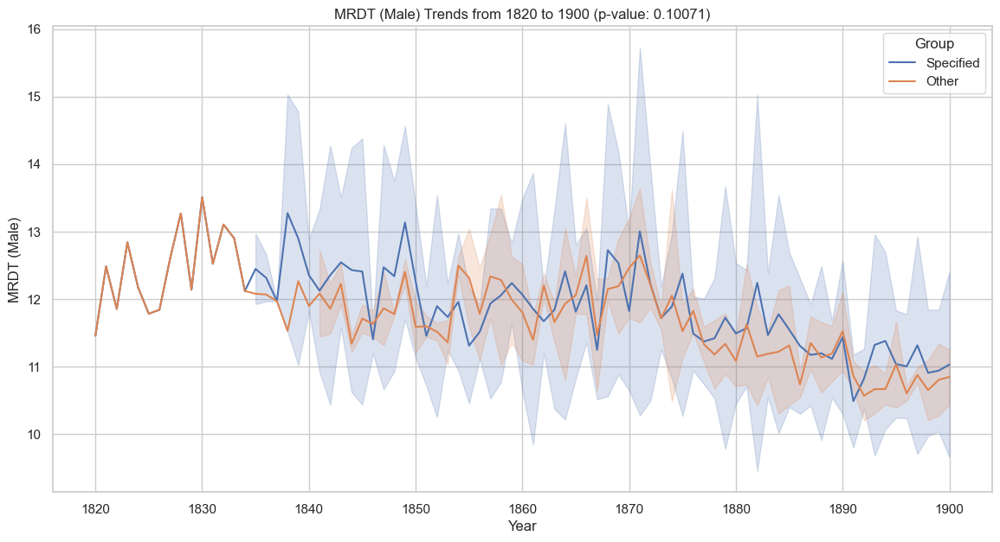

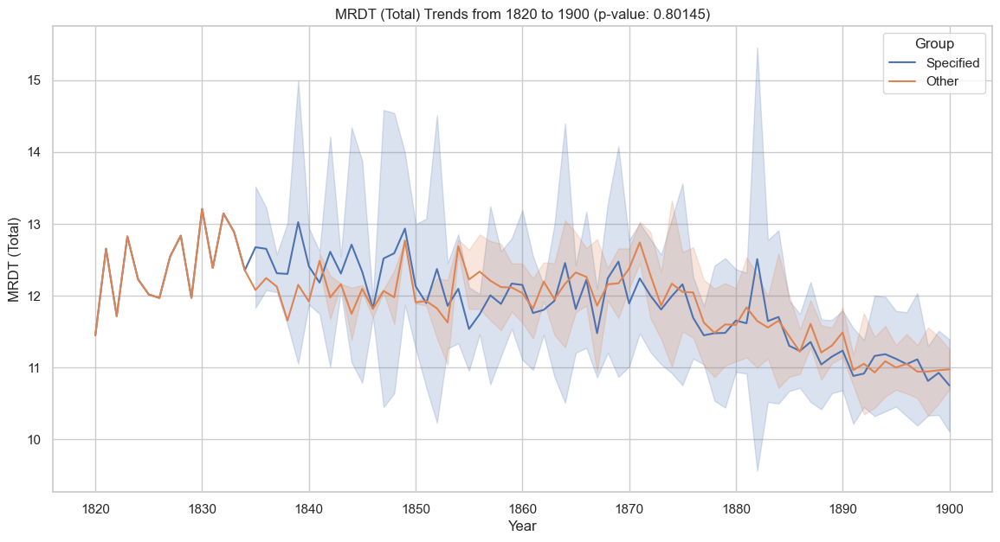

Mean MRDT from 1901 to 1950:
           MRDT_Female  MRDT_Male  MRDT_Total
Group                                        
Other         9.959729  10.318410   10.227963
Specified     9.875016  10.116313   10.109232
P-values from 1901 to 1950:
MRDT_Female: 0.27134
MRDT_Male: 0.06712
MRDT_Total: 0.18463


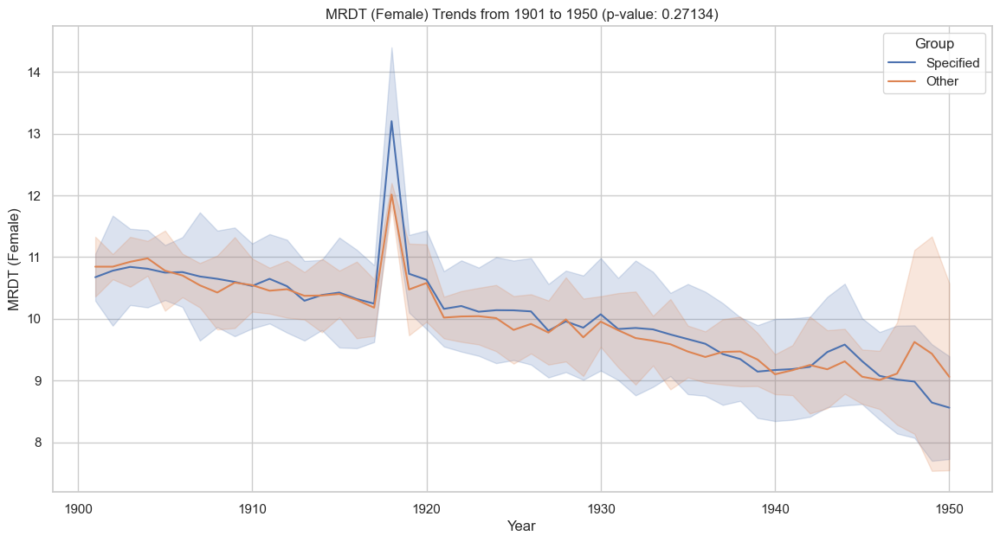

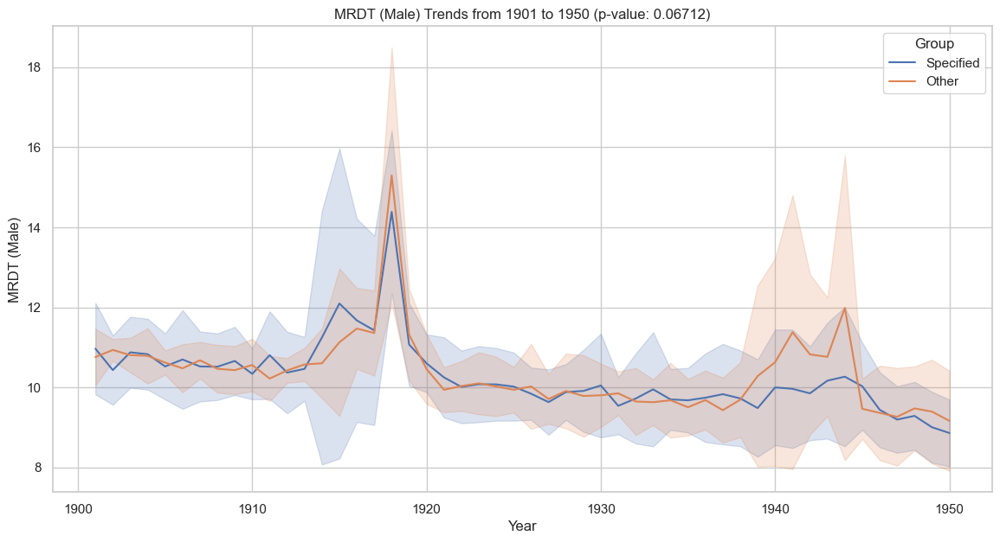

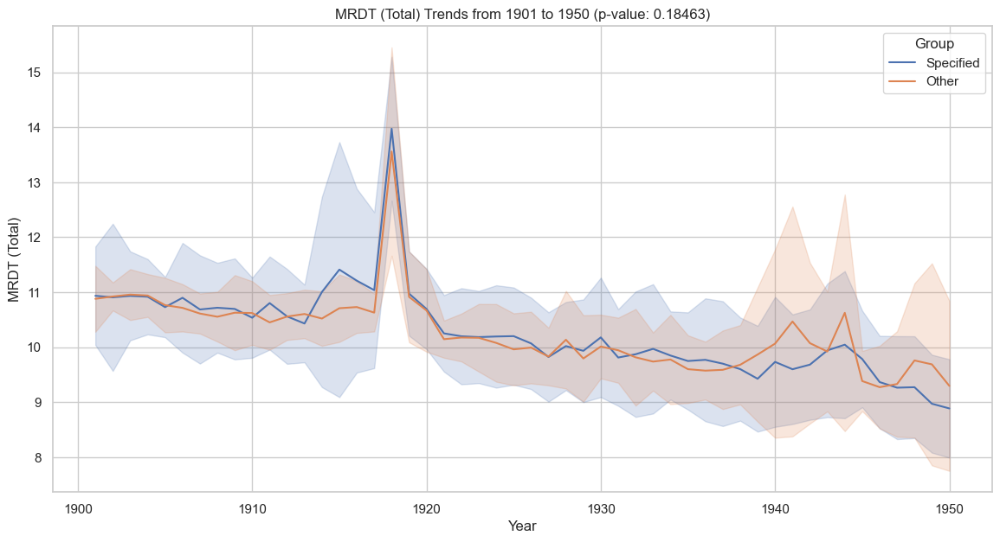

Mean MRDT from 1951 to 1980:
           MRDT_Female  MRDT_Male  MRDT_Total
Group                                        
Other         7.771773   8.621841    8.416751
Specified     7.624701   8.313345    8.136054
P-values from 1951 to 1980:
MRDT_Female: 0.00006
MRDT_Male: 0.00000
MRDT_Total: 0.00000


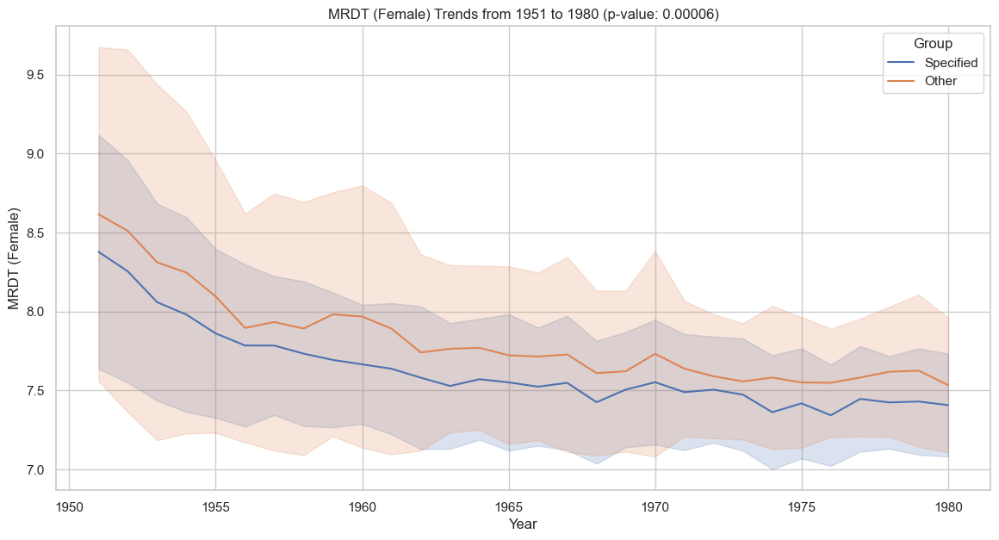

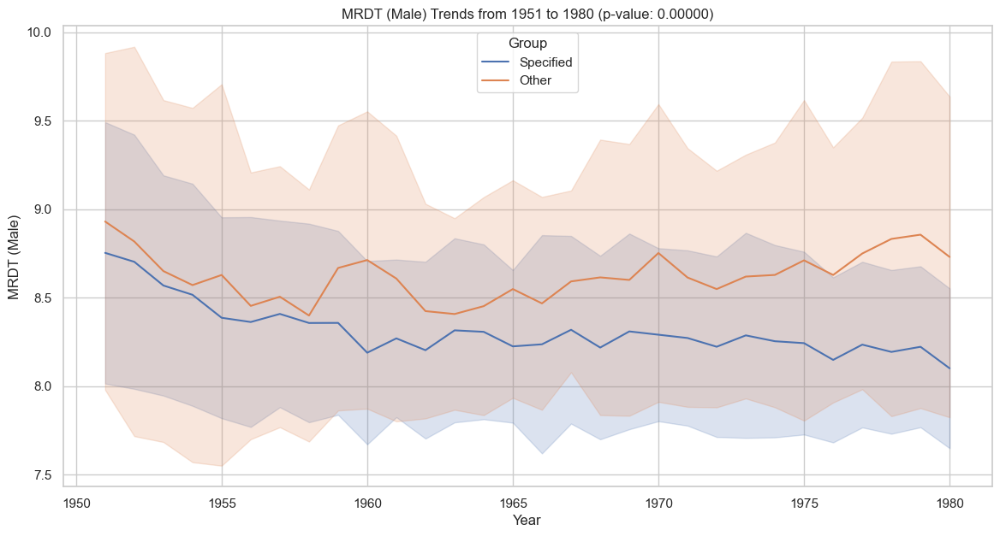

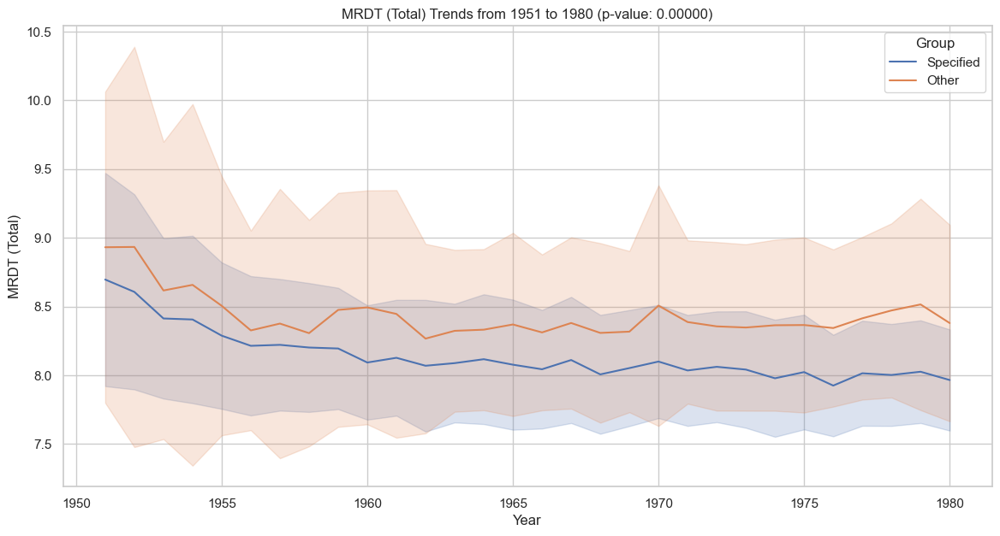

Mean MRDT from 1981 to 2000:
           MRDT_Female  MRDT_Male  MRDT_Total
Group                                        
Other         7.420433   8.529304    8.257941
Specified     7.311503   8.072558    7.895566
P-values from 1981 to 2000:
MRDT_Female: 0.00000
MRDT_Male: 0.00000
MRDT_Total: 0.00000


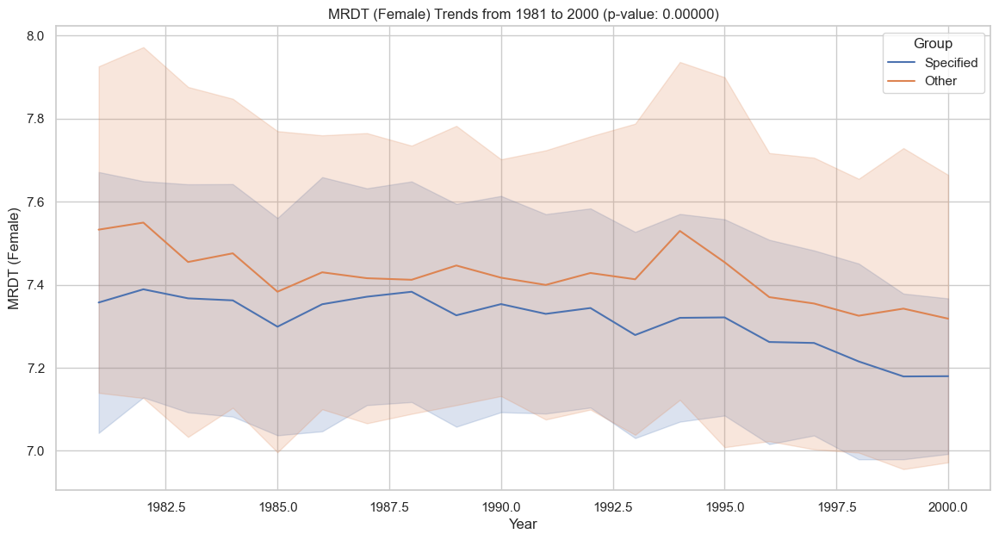

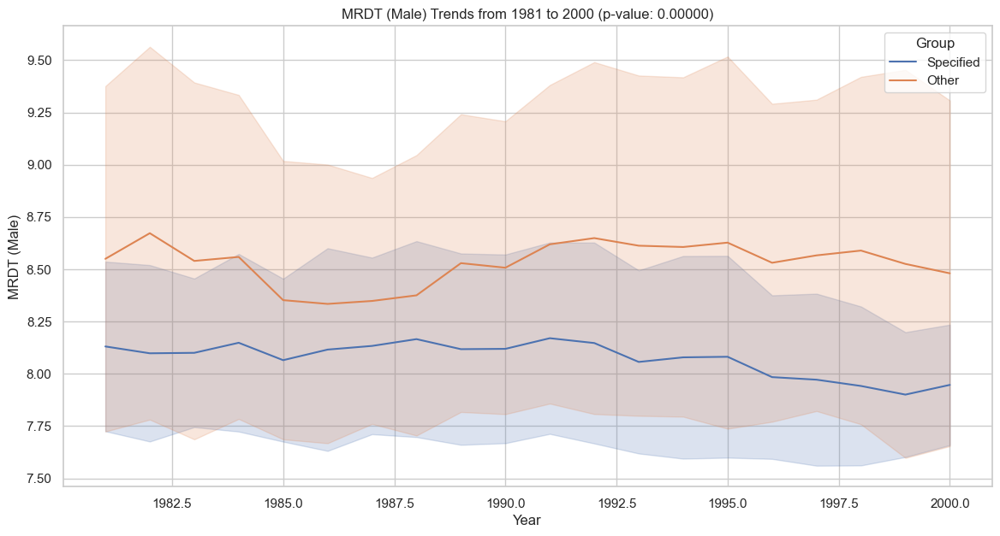

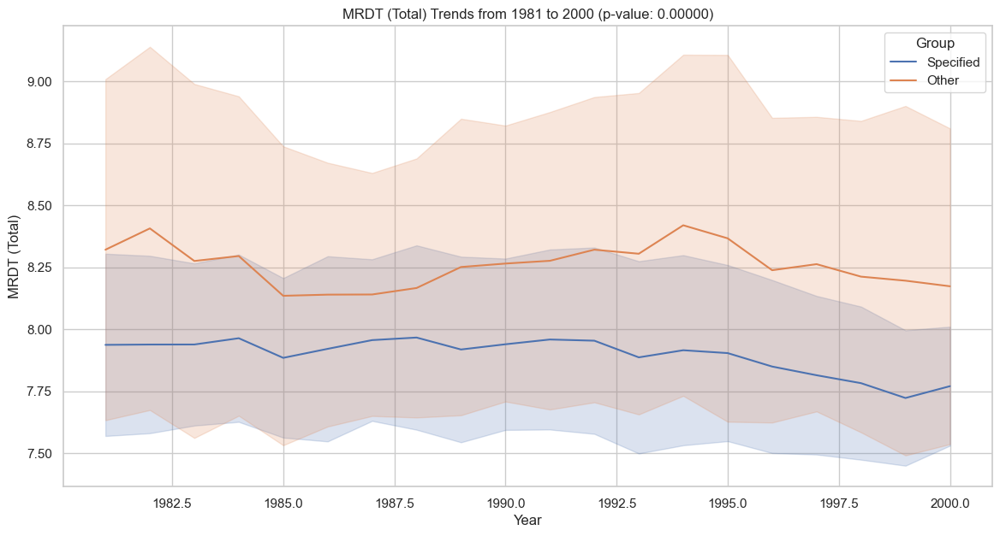

Mean MRDT from 2001 to 2020:
           MRDT_Female  MRDT_Male  MRDT_Total
Group                                        
Other         7.150244   8.174255    7.896377
Specified     7.003362   7.614353    7.464013
P-values from 2001 to 2020:
MRDT_Female: 0.00000
MRDT_Male: 0.00000
MRDT_Total: 0.00000


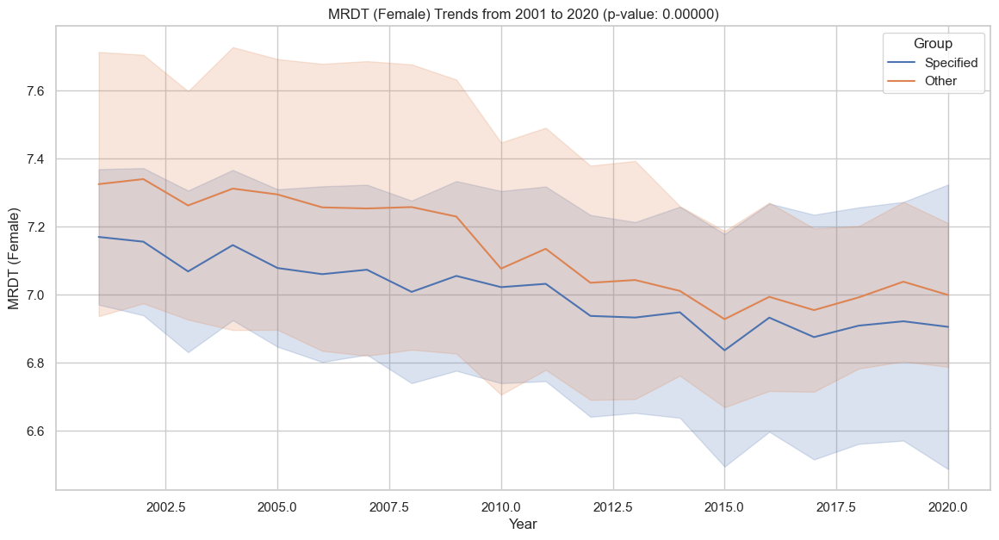

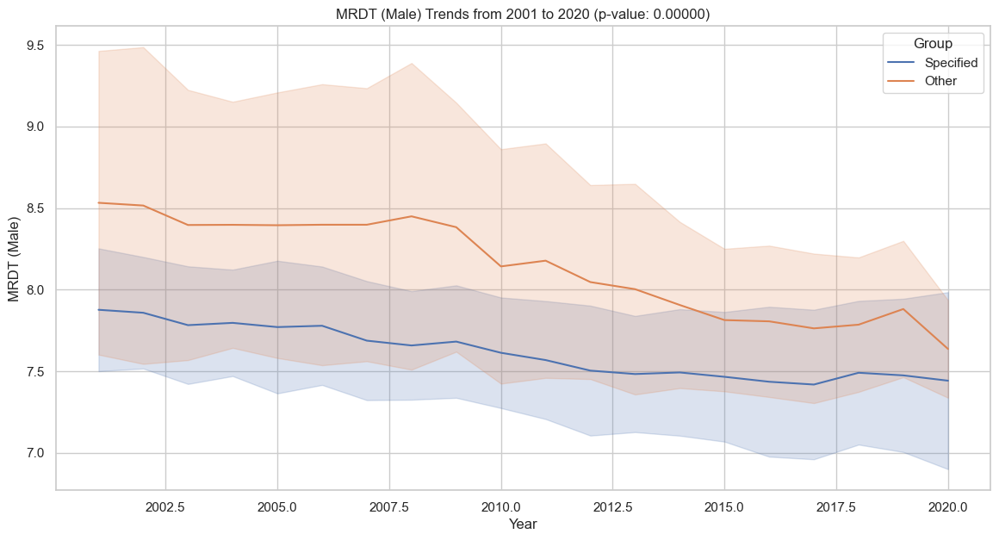

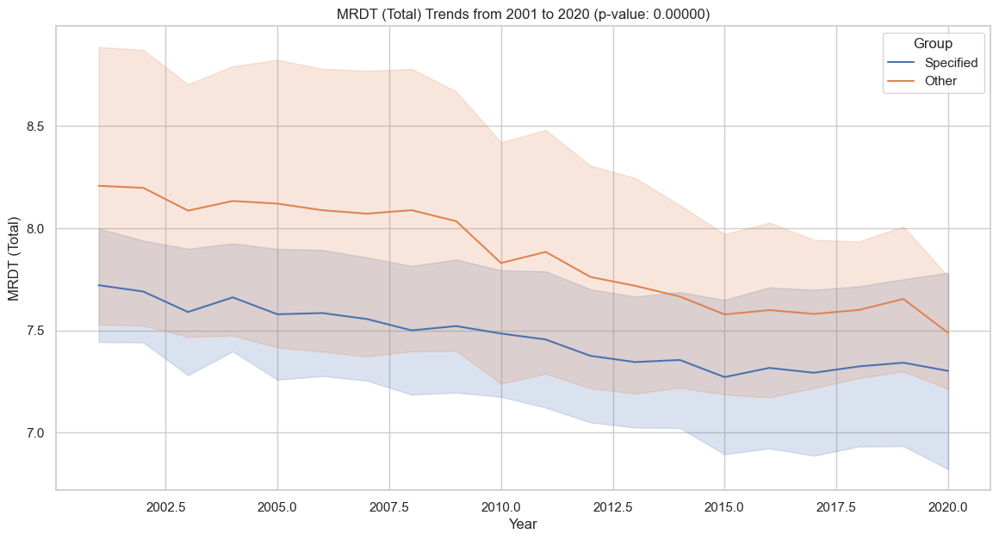

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind

# Define periods to analyze
periods = [(1820, 1900), (1901, 1950), (1951, 1980), (1981, 2000), (2001, 2020)]

# Helper function to calculate p-values
def calculate_p_values(df1, df2, column):
    ttest_result = ttest_ind(df1[column].dropna(), df2[column].dropna())
    return ttest_result.pvalue

# Analyze trends over these periods
for start_year, end_year in periods:
    period_df = combined_df[(combined_df['Year'] >= start_year) & (combined_df['Year'] <= end_year)]
    
    # Calculate mean MRDT for the period
    mean_mrdt_period = period_df.groupby('Group')[['MRDT_Female', 'MRDT_Male', 'MRDT_Total']].mean()
    print(f"Mean MRDT from {start_year} to {end_year}:")
    print(mean_mrdt_period)
    
    # Separate specified and other groups
    specified_group = period_df[period_df['Group'] == 'Specified']
    other_group = period_df[period_df['Group'] == 'Other']
    
    # Calculate p-values for the period
    p_value_female = calculate_p_values(specified_group, other_group, 'MRDT_Female')
    p_value_male = calculate_p_values(specified_group, other_group, 'MRDT_Male')
    p_value_total = calculate_p_values(specified_group, other_group, 'MRDT_Total')
    
    print(f"P-values from {start_year} to {end_year}:")
    print(f"MRDT_Female: {p_value_female:.5f}")
    print(f"MRDT_Male: {p_value_male:.5f}")
    print(f"MRDT_Total: {p_value_total:.5f}")

    # Plot MRDT trends for the period
    plt.figure(figsize=(14, 7))
    sns.lineplot(data=period_df, x='Year', y='MRDT_Female', hue='Group', errorbar='sd')
    plt.title(f'MRDT (Female) Trends from {start_year} to {end_year} (p-value: {p_value_female:.5f})')
    plt.xlabel('Year')
    plt.ylabel('MRDT (Female)')
    plt.legend(title='Group')
    plt.show()
    
    plt.figure(figsize=(14, 7))
    sns.lineplot(data=period_df, x='Year', y='MRDT_Male', hue='Group', errorbar='sd')
    plt.title(f'MRDT (Male) Trends from {start_year} to {end_year} (p-value: {p_value_male:.5f})')
    plt.xlabel('Year')
    plt.ylabel('MRDT (Male)')
    plt.legend(title='Group')
    plt.show()

    plt.figure(figsize=(14, 7))
    sns.lineplot(data=period_df, x='Year', y='MRDT_Total', hue='Group', errorbar='sd')
    plt.title(f'MRDT (Total) Trends from {start_year} to {end_year} (p-value: {p_value_total:.5f})')
    plt.xlabel('Year')
    plt.ylabel('MRDT (Total)')
    plt.legend(title='Group')
    plt.show()


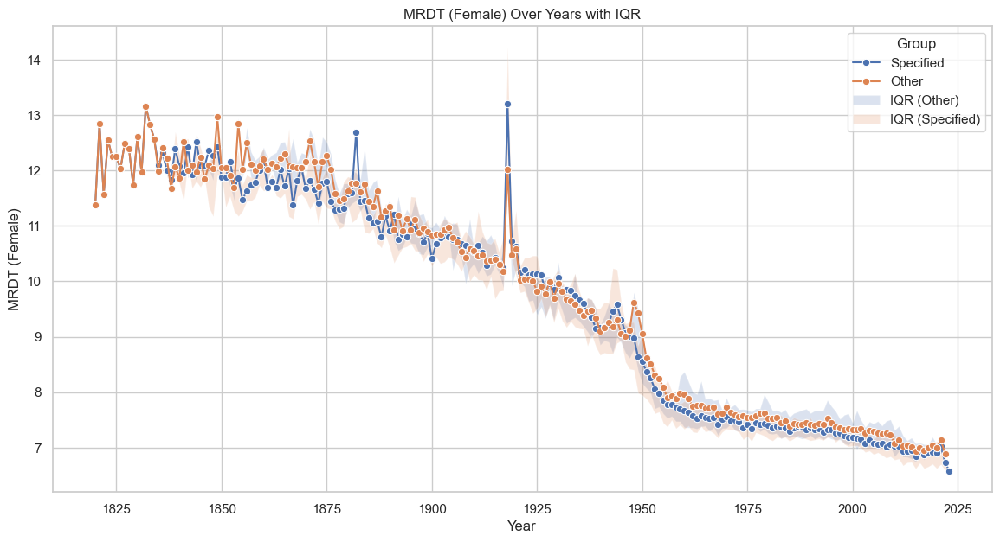

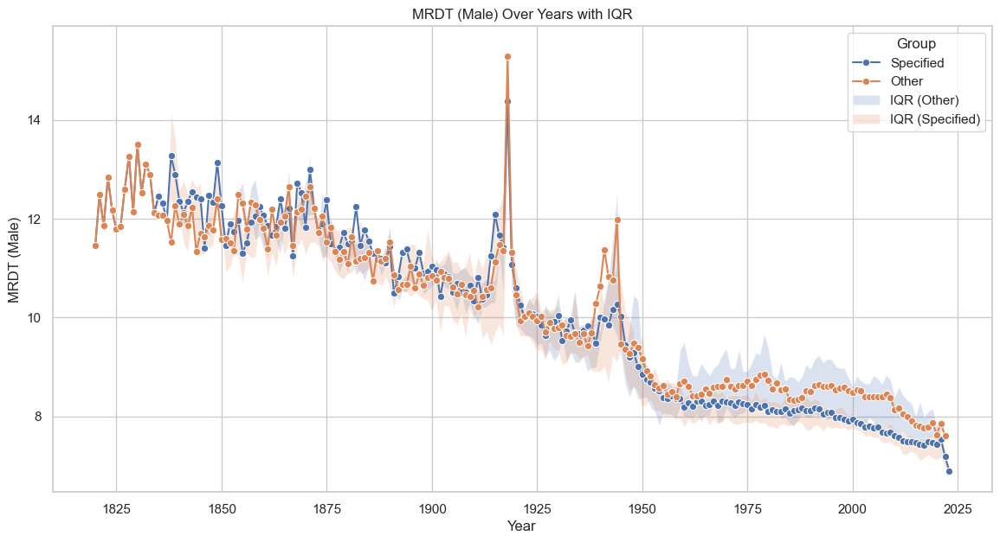

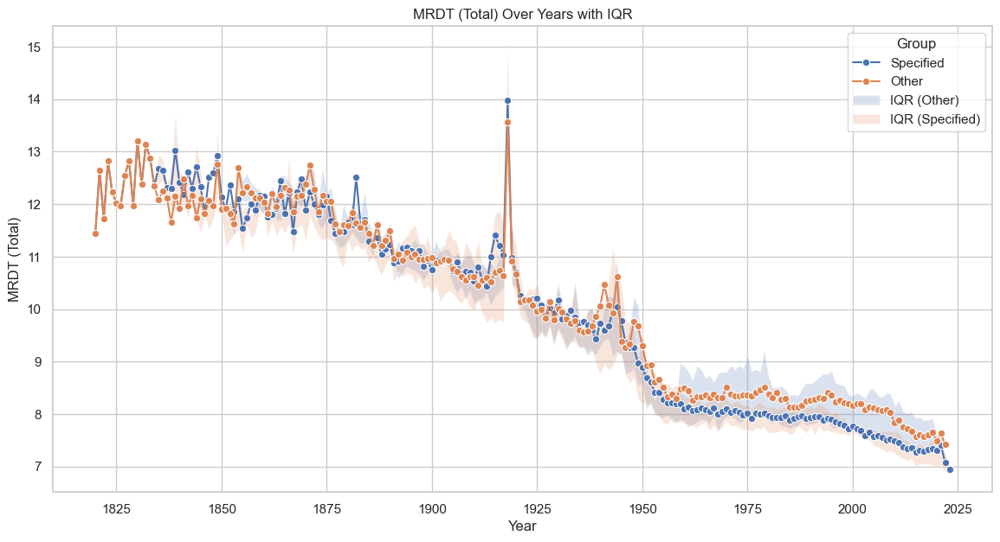

## Non-Linear Trends and Differences
Analyzing non-linear trends and calculating the differences between specified and other groups.

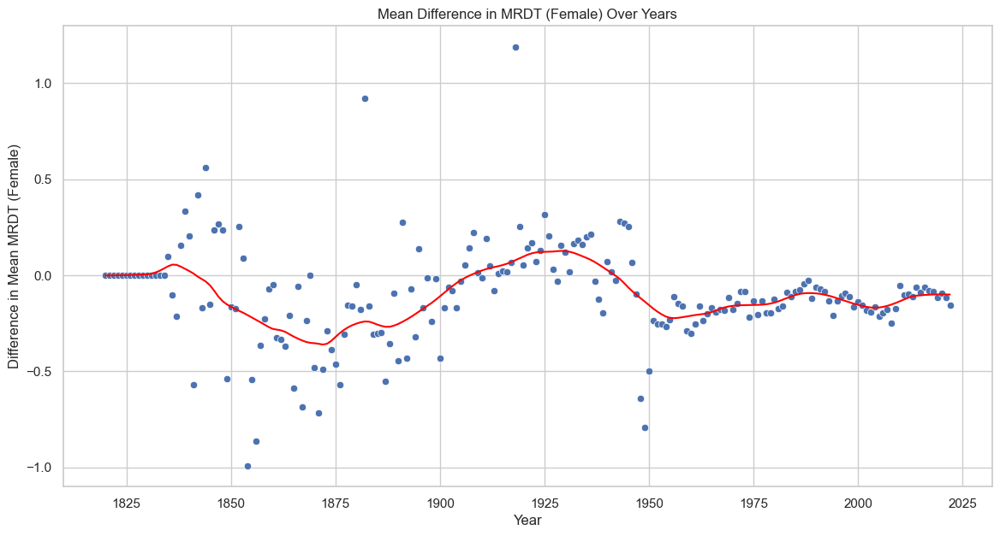

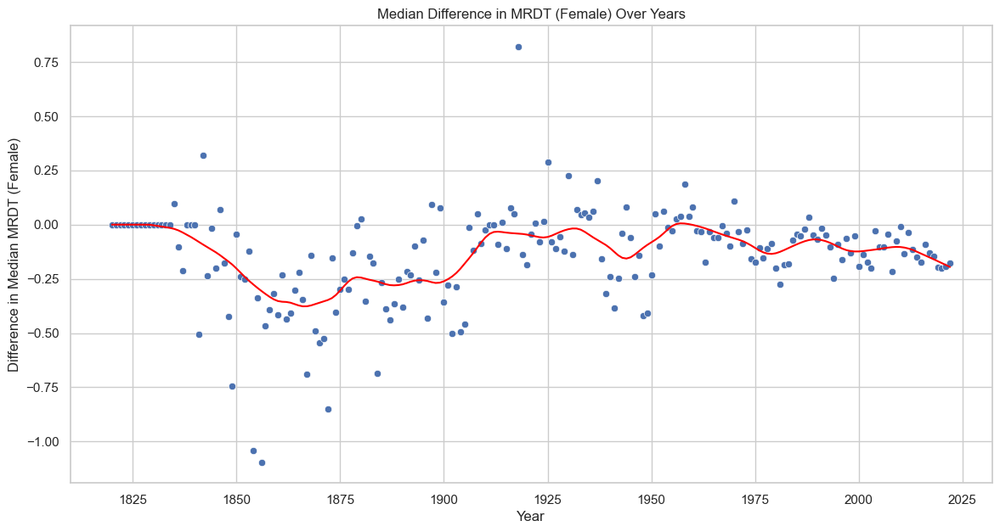

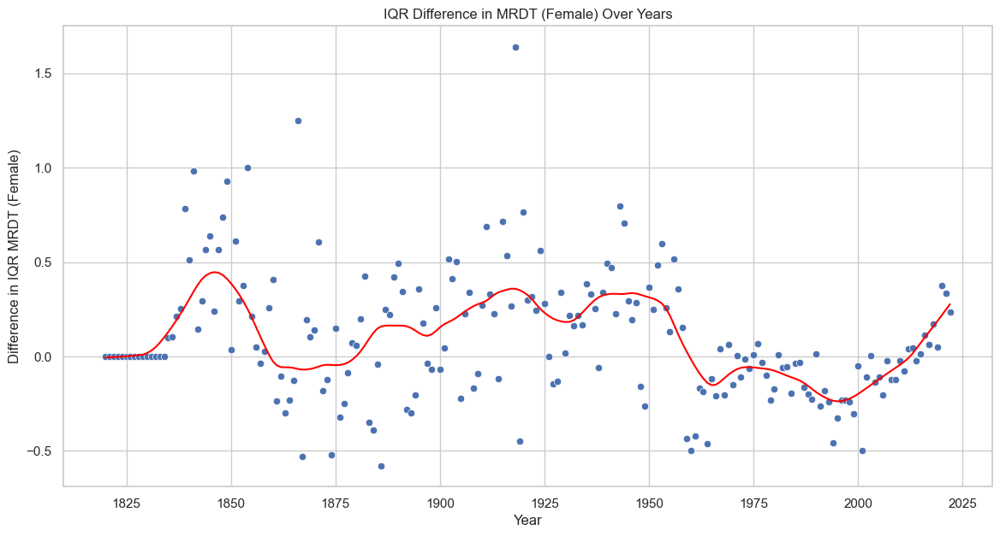

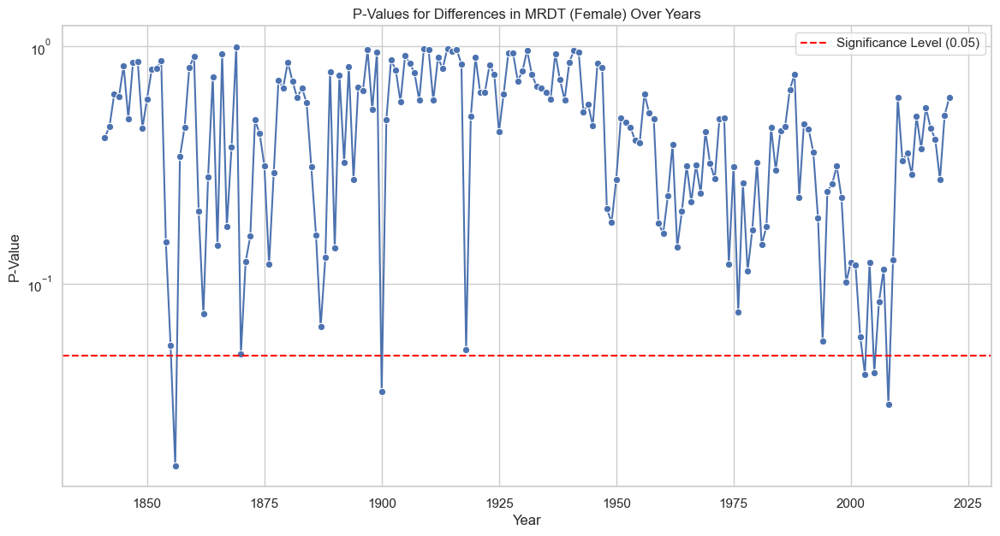

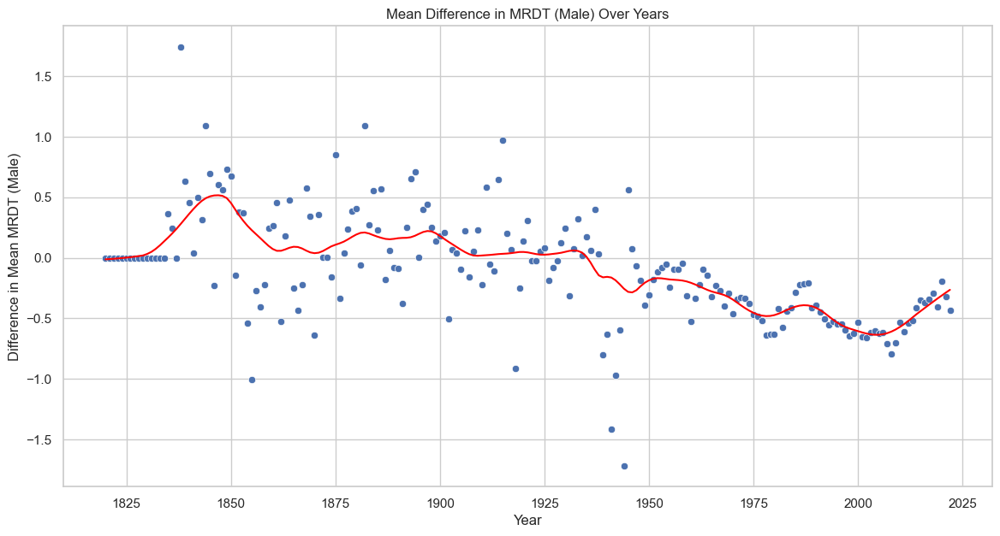

...

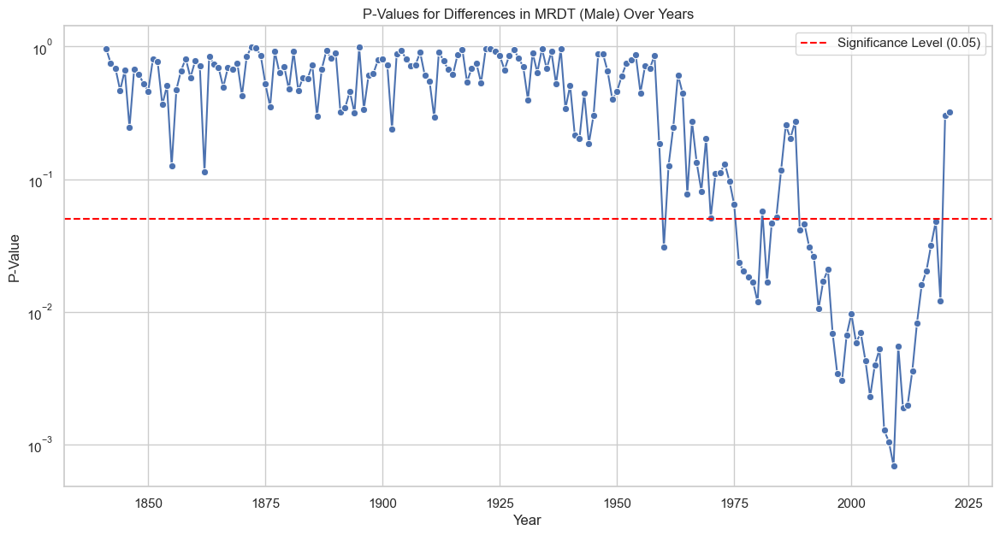

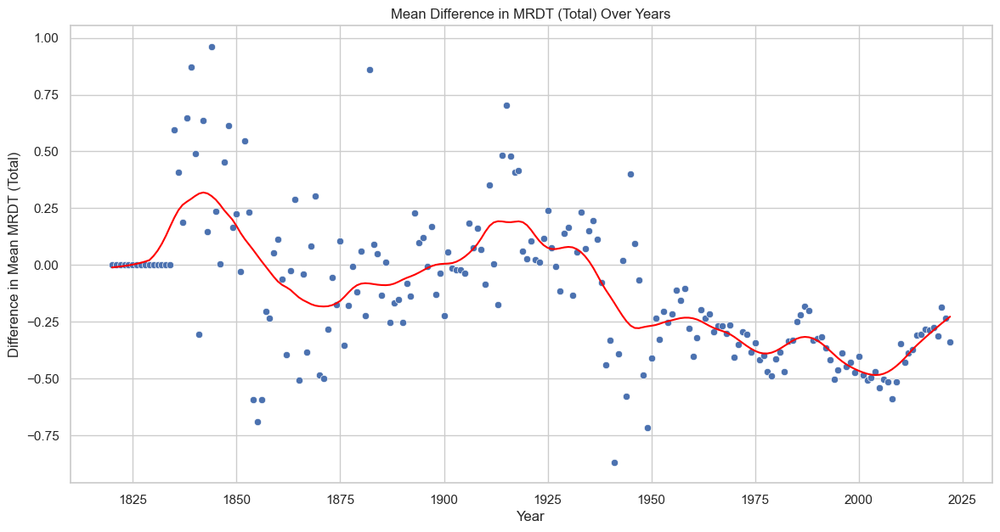

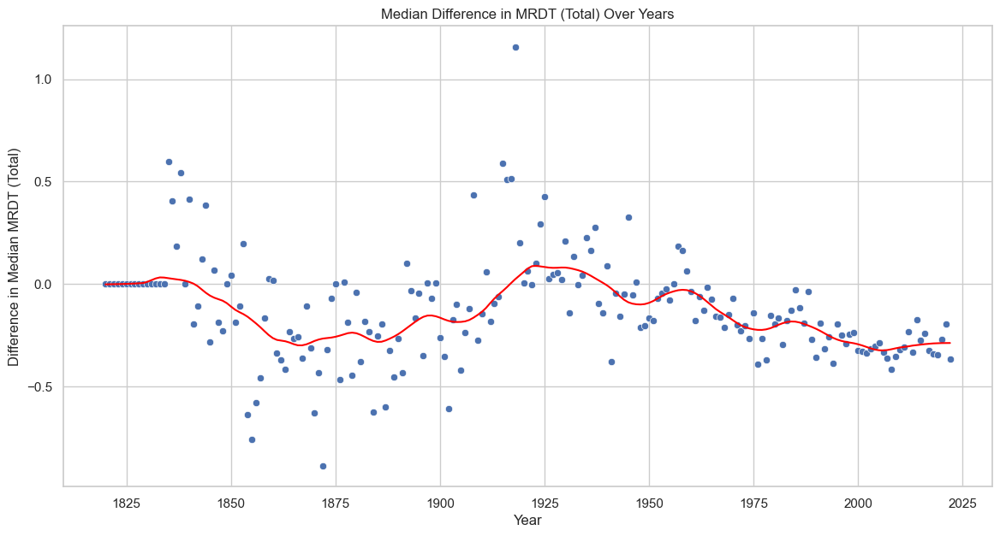

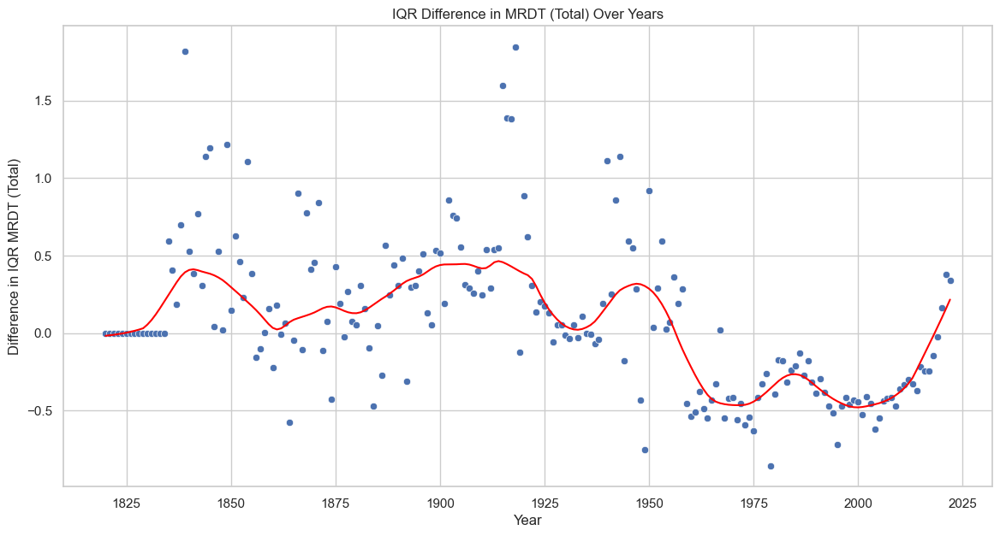

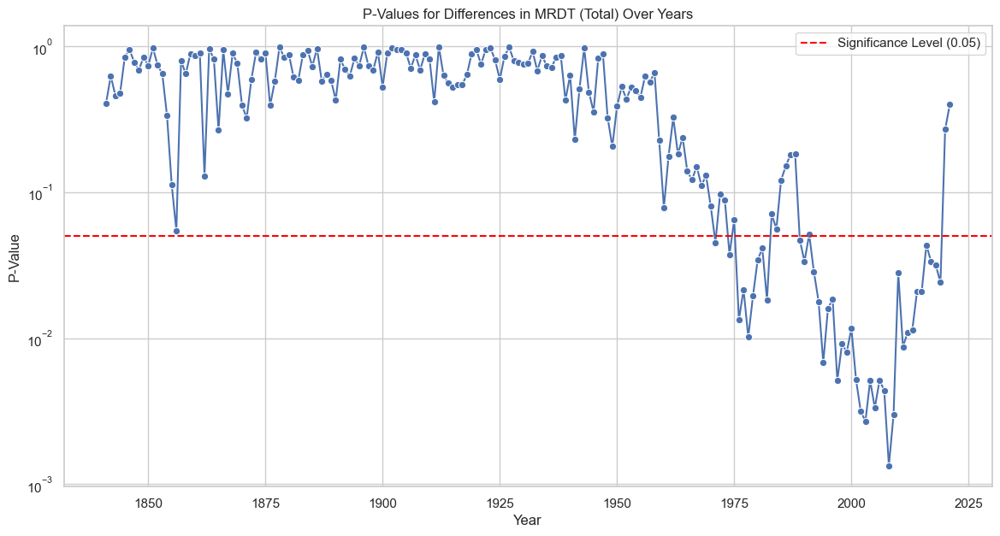

Summary Statistics for Specified Group:
     Year  MRDT_Female_mean  MRDT_Female_median  MRDT_Female_<lambda_0>  \
0    1820         11.382134           11.382134               11.382134   
1    1821         12.842122           12.842122               12.842122   
2    1822         11.565454           11.565454               11.565454   
3    1823         12.548839           12.548839               12.548839   
4    1824         12.252067           12.252067               12.252067   
..    ...               ...                 ...                     ...   
199  2019          6.921591            6.861947                6.704293   
200  2020          6.905169            6.790352                6.625225   
201  2021          7.021892            6.922613                6.701459   
202  2022          6.731895            6.707975                6.586873   
203  2023          6.580426            6.580426                6.580426   

     MRDT_Female_<lambda_1>  MRDT_Male_mean  MRDT_Male_medi

In [41]:
# Calculate differences
def calculate_differences(specified, other):
    merged = specified.merge(other, on='Year', suffixes=('_Specified', '_Other'))
    for col in ['MRDT_Female', 'MRDT_Male', 'MRDT_Total']:
        merged[f'{col}_Diff_Mean'] = merged[f'{col}_mean_Specified'] - merged[f'{col}_mean_Other']
        merged[f'{col}_Diff_Median'] = merged[f'{col}_median_Specified'] - merged[f'{col}_median_Other']
        merged[f'{col}_Diff_IQR'] = (merged[f'{col}_<lambda_1>_Specified'] - merged[f'{col}_<lambda_0>_Specified']) - (merged[f'{col}_<lambda_1>_Other'] - merged[f'{col}_<lambda_0>_Other'])
    return merged

diff_data = calculate_differences(mean_mrdt_specified_by_year, mean_mrdt_other_by_year)

# Plot non-linear trend lines using LOESS
def plot_non_linear_trend(data, x, y, title, ylabel):
    plt.figure(figsize=(14, 7))
    sns.scatterplot(data=data, x=x, y=y)
    
    # Fit non-linear trend using LOESS
    smoothed = lowess(data[y], data[x], frac=0.1)
    plt.plot(smoothed[:, 0], smoothed[:, 1], color='red')
    
    plt.title(title)
    plt.xlabel('Year')
    plt.ylabel(ylabel)
    plt.show()

# Perform t-tests for differences and calculate p-values
def calculate_p_values(data, col):
    p_values = []
    years = data['Year'].unique()
    for year in years:
        specified_values = specified_group_df[specified_group_df['Year'] == year][col].dropna()
        other_values = other_group_df[other_group_df['Year'] == year][col].dropna()
        if len(specified_values) > 1 and len(other_values) > 1:
            t_stat, p_val = ttest_ind(specified_values, other_values)
            p_values.append({'Year': year, 'P_Value': p_val})
    return pd.DataFrame(p_values)

p_values_female = calculate_p_values(diff_data, 'MRDT_Female')
p_values_male = calculate_p_values(diff_data, 'MRDT_Male')
p_values_total = calculate_p_values(diff_data, 'MRDT_Total')

# Plot p-values
def plot_p_values(p_values, title):
    plt.figure(figsize=(14, 7))
    sns.lineplot(data=p_values, x='Year', y='P_Value', marker='o')
    plt.axhline(0.05, color='red', linestyle='--', label='Significance Level (0.05)')
    plt.yscale('log')
    plt.title(title)
    plt.xlabel('Year')
    plt.ylabel('P-Value')
    plt.legend()
    plt.show()

# Plot differences and p-values
plot_non_linear_trend(diff_data, 'Year', 'MRDT_Female_Diff_Mean', 'Mean Difference in MRDT (Female) Over Years', 'Difference in Mean MRDT (Female)')
plot_non_linear_trend(diff_data, 'Year', 'MRDT_Female_Diff_Median', 'Median Difference in MRDT (Female) Over Years', 'Difference in Median MRDT (Female)')
plot_non_linear_trend(diff_data, 'Year', 'MRDT_Female_Diff_IQR', 'IQR Difference in MRDT (Female) Over Years', 'Difference in IQR MRDT (Female)')
plot_p_values(p_values_female, 'P-Values for Differences in MRDT (Female) Over Years')

plot_non_linear_trend(diff_data, 'Year', 'MRDT_Male_Diff_Mean', 'Mean Difference in MRDT (Male) Over Years', 'Difference in Mean MRDT (Male)')
plot_non_linear_trend(diff_data, 'Year', 'MRDT_Male_Diff_Median', 'Median Difference in MRDT (Male) Over Years', 'Difference in Median MRDT (Male)')
plot_non_linear_trend(diff_data, 'Year', 'MRDT_Male_Diff_IQR', 'IQR Difference in MRDT (Male) Over Years', 'Difference in IQR MRDT (Male)')
plot_p_values(p_values_male, 'P-Values for Differences in MRDT (Male) Over Years')

plot_non_linear_trend(diff_data, 'Year', 'MRDT_Total_Diff_Mean', 'Mean Difference in MRDT (Total) Over Years', 'Difference in Mean MRDT (Total)')
plot_non_linear_trend(diff_data, 'Year', 'MRDT_Total_Diff_Median', 'Median Difference in MRDT (Total) Over Years', 'Difference in Median MRDT (Total)')
plot_non_linear_trend(diff_data, 'Year', 'MRDT_Total_Diff_IQR', 'IQR Difference in MRDT (Total) Over Years', 'Difference in IQR MRDT (Total)')
plot_p_values(p_values_total, 'P-Values for Differences in MRDT (Total) Over Years')

# Print summary statistics
print("Summary Statistics for Specified Group:")
print(mean_mrdt_specified_by_year[['Year', 'MRDT_Female_mean', 'MRDT_Female_median', 'MRDT_Female_<lambda_0>', 'MRDT_Female_<lambda_1>', 
                                   'MRDT_Male_mean', 'MRDT_Male_median', 'MRDT_Male_<lambda_0>', 'MRDT_Male_<lambda_1>', 
                                   'MRDT_Total_mean', 'MRDT_Total_median', 'MRDT_Total_<lambda_0>', 'MRDT_Total_<lambda_1>']])

print("\nSummary Statistics for Other Group:")
print(mean_mrdt_other_by_year[['Year', 'MRDT_Female_mean', 'MRDT_Female_median', 'MRDT_Female_<lambda_0>', 'MRDT_Female_<lambda_1>', 
                               'MRDT_Male_mean', 'MRDT_Male_median', 'MRDT_Male_<lambda_0>', 'MRDT_Male_<lambda_1>', 
                               'MRDT_Total_mean', 'MRDT_Total_median', 'MRDT_Total_<lambda_0>', 'MRDT_Total_<lambda_1>']])

## Additional Analysis
Performing further analysis to compare the specified group of countries with other countries.

### Distribution Comparison
Comparing the distributions of MRDT for females, males, and total population between the specified group and other countries.

In [61]:
# Selecting only numeric columns for correlation calculation
numeric_cols_group_a = specified_group_df.select_dtypes(include=[np.number])
numeric_cols_group_b = other_group_df.select_dtypes(include=[np.number])

# Aggregate data by year for both groups
agg_group_a = numeric_cols_group_a.groupby('Year').mean().reset_index()
agg_group_b = numeric_cols_group_b.groupby('Year').mean().reset_index()

# Merge the aggregated DataFrames on the 'Year' column
merged_df = pd.merge(agg_group_a, agg_group_b, on='Year', suffixes=('_group_a', '_group_b'))

# Calculate correlations between corresponding columns in the two groups
corr_matrix = merged_df.corr()

# Extract relevant correlations (between group_a and group_b)
relevant_corr = corr_matrix.loc[
    ['MRDT_Female_group_a', 'MRDT_Male_group_a', 'MRDT_Total_group_a'],
    ['MRDT_Female_group_b', 'MRDT_Male_group_b', 'MRDT_Total_group_b']
]

print("Relevant Correlation Matrix between Group A and Group B:")
print(relevant_corr)



Relevant Correlation Matrix between Group A and Group B:
                     MRDT_Female_group_b  MRDT_Male_group_b  \
MRDT_Female_group_a             0.991916           0.958217   
MRDT_Male_group_a               0.976098           0.973772   
MRDT_Total_group_a              0.987619           0.970395   

                     MRDT_Total_group_b  
MRDT_Female_group_a            0.986167  
MRDT_Male_group_a              0.984302  
MRDT_Total_group_a             0.989359  


In [43]:

# Selecting only numeric columns for correlation calculation
numeric_cols_specified = specified_group_df.select_dtypes(include=[np.number])
numeric_cols_other = other_group_df.select_dtypes(include=[np.number])

# Aggregate data by year
agg_specified = numeric_cols_specified.groupby('Year').mean().reset_index()
agg_other = numeric_cols_other.groupby('Year').mean().reset_index()

# Merge the aggregated DataFrames on the 'Year' column
merged_df = pd.merge(agg_specified, agg_other, on='Year', suffixes=('_specified', '_other'))

# Calculate correlations between corresponding columns in the specified and other groups
corr_matrix = merged_df.corr()

# Extract relevant correlations (between specified and other groups)
relevant_corr = corr_matrix.loc[
    ['MRDT_Female_specified', 'MRDT_Male_specified', 'MRDT_Total_specified'],
    ['MRDT_Female_other', 'MRDT_Male_other', 'MRDT_Total_other']
]

print("Relevant Correlation Matrix between Specified and Other Groups:")
print(relevant_corr)

# Display the correlation matrices for individual groups
print("\nCorrelation Matrix for Specified Group:")
print(numeric_cols_specified.corr())

print("\nCorrelation Matrix for Other Group:")
print(numeric_cols_other.corr())


Relevant Correlation Matrix between Specified and Other Groups:
                       MRDT_Female_other  MRDT_Male_other  MRDT_Total_other
MRDT_Female_specified           0.991916         0.958217          0.986167
MRDT_Male_specified             0.976098         0.973772          0.984302
MRDT_Total_specified            0.987619         0.970395          0.989359

Correlation Matrix for Specified Group:
                        Year  MRDT_Female  MRDT_Male  MRDT_Total  \
Year                1.000000    -0.919063  -0.840163   -0.888679   
MRDT_Female        -0.919063     1.000000   0.916727    0.974981   
MRDT_Male          -0.840163     0.916727   1.000000    0.975633   
MRDT_Total         -0.888679     0.974981   0.975633    1.000000   
MRDT_Female_Change -0.097173     0.193781   0.152549    0.181900   
MRDT_Male_Change   -0.090232     0.133237   0.246481    0.184292   
MRDT_Total_Change  -0.097553     0.173277   0.202010    0.201352   

                    MRDT_Female_Change  MRDT_M

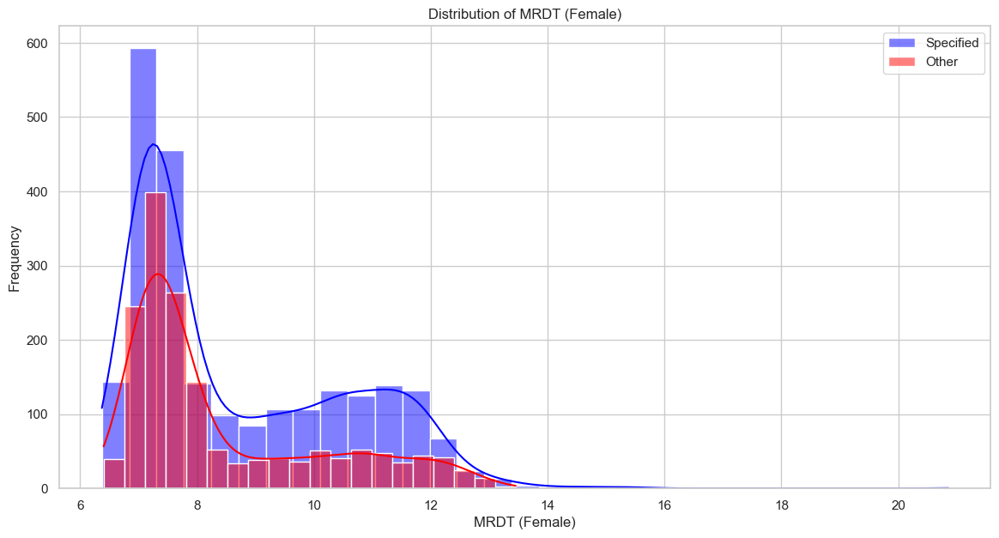

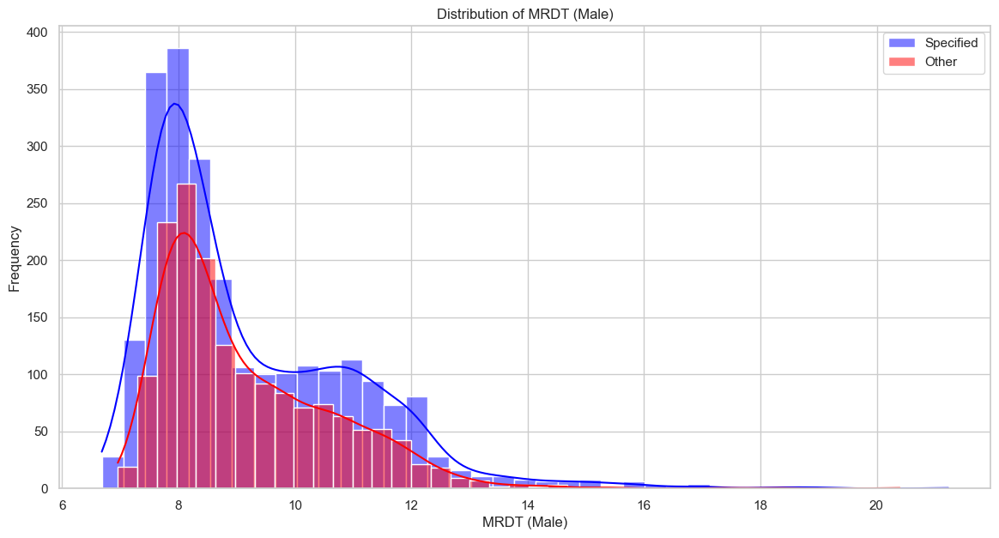

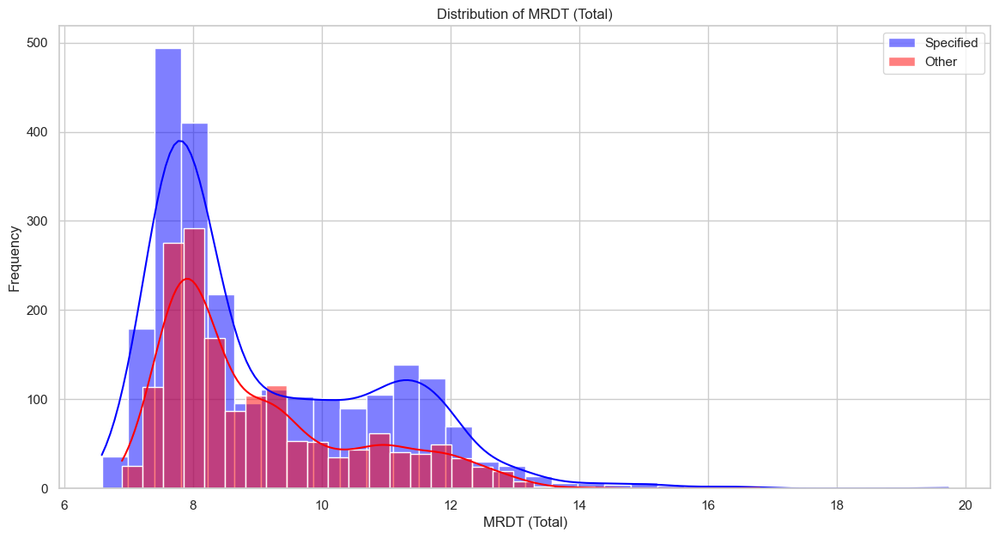

In [44]:
# Plot distributions for MRDT (Female)
plt.figure(figsize=(14, 7))
sns.histplot(specified_group_df['MRDT_Female'], color='blue', label='Specified', kde=True)
sns.histplot(other_group_df['MRDT_Female'], color='red', label='Other', kde=True)
plt.title('Distribution of MRDT (Female)')
plt.xlabel('MRDT (Female)')
plt.ylabel('Frequency')
plt.legend()
plt.show()

# Plot distributions for MRDT (Male)
plt.figure(figsize=(14, 7))
sns.histplot(specified_group_df['MRDT_Male'], color='blue', label='Specified', kde=True)
sns.histplot(other_group_df['MRDT_Male'], color='red', label='Other', kde=True)
plt.title('Distribution of MRDT (Male)')
plt.xlabel('MRDT (Male)')
plt.ylabel('Frequency')
plt.legend()
plt.show()

# Plot distributions for MRDT (Total)
plt.figure(figsize=(14, 7))
sns.histplot(specified_group_df['MRDT_Total'], color='blue', label='Specified', kde=True)
sns.histplot(other_group_df['MRDT_Total'], color='red', label='Other', kde=True)
plt.title('Distribution of MRDT (Total)')
plt.xlabel('MRDT (Total)')
plt.ylabel('Frequency')
plt.legend()
plt.show()

### Boxplots for IQR Analysis
Visualizing the interquartile range (IQR) for MRDT.

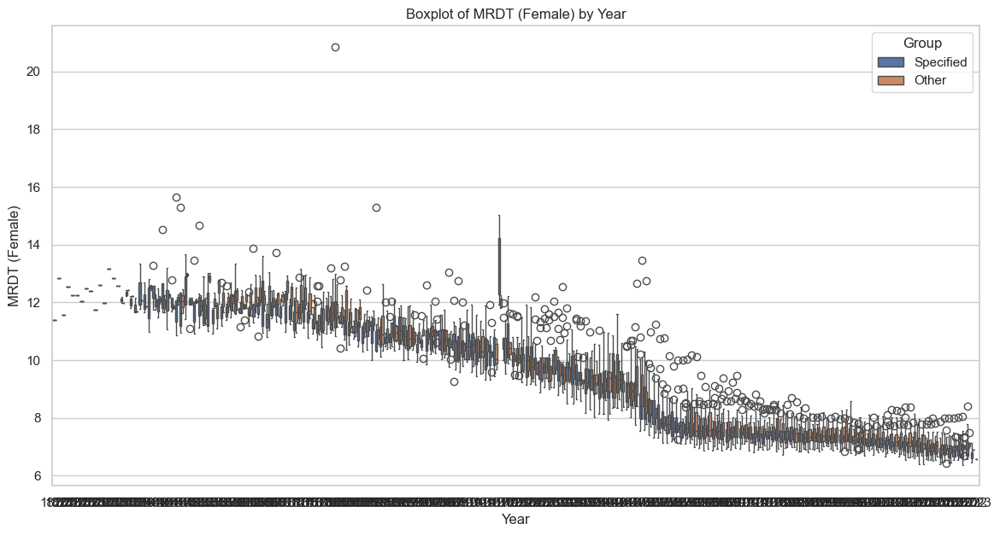

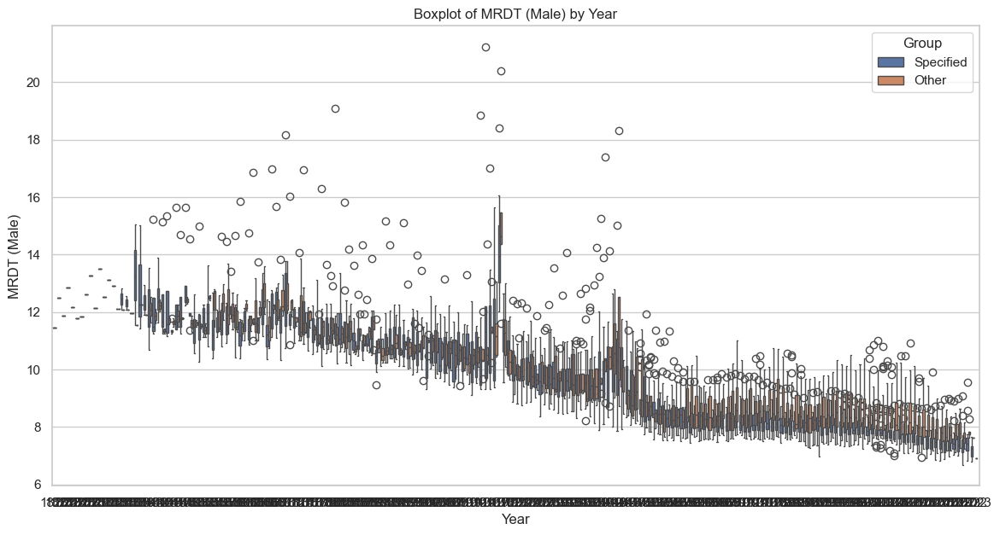

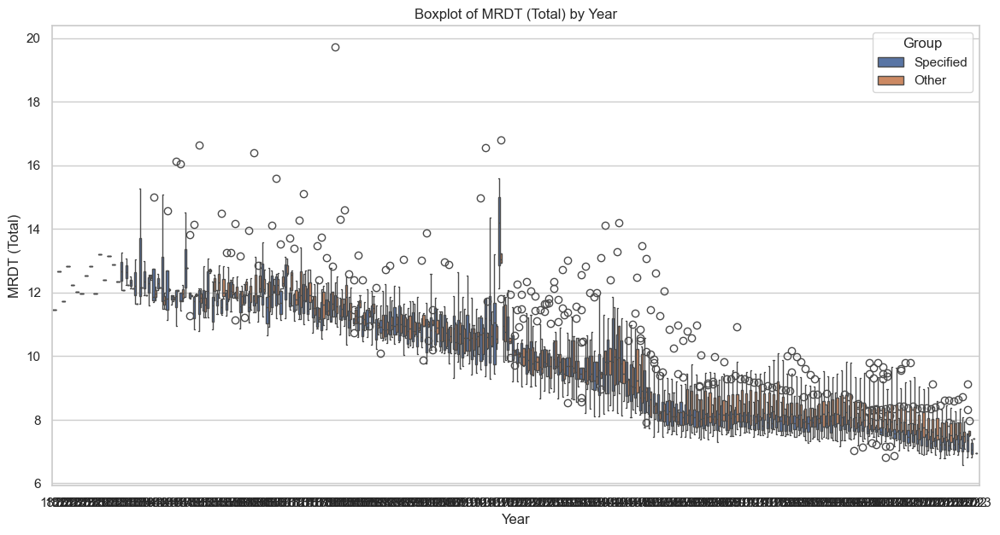

In [45]:
# Boxplot for MRDT (Female)
plt.figure(figsize=(14, 7))
sns.boxplot(x='Year', y='MRDT_Female', data=combined_df, hue='Group')
plt.title('Boxplot of MRDT (Female) by Year')
plt.xlabel('Year')
plt.ylabel('MRDT (Female)')
plt.legend(title='Group')
plt.show()

# Boxplot for MRDT (Male)
plt.figure(figsize=(14, 7))
sns.boxplot(x='Year', y='MRDT_Male', data=combined_df, hue='Group')
plt.title('Boxplot of MRDT (Male) by Year')
plt.xlabel('Year')
plt.ylabel('MRDT (Male)')
plt.legend(title='Group')
plt.show()

# Boxplot for MRDT (Total)
plt.figure(figsize=(14, 7))
sns.boxplot(x='Year', y='MRDT_Total', data=combined_df, hue='Group')
plt.title('Boxplot of MRDT (Total) by Year')
plt.xlabel('Year')
plt.ylabel('MRDT (Total)')
plt.legend(title='Group')
plt.show()

### Correlation Analysis
Analyzing the correlation between MRDT and Year within each group.

In [54]:
# Aggregate data by year
agg_specified = numeric_cols_specified.groupby('Year').mean().reset_index()
agg_other = numeric_cols_other.groupby('Year').mean().reset_index()

# Merge the aggregated DataFrames on the 'Year' column
merged_df = pd.merge(agg_specified, agg_other, on='Year', suffixes=('_specified', '_other'))

# Calculate correlations between corresponding columns in the specified and other groups
corr_matrix = merged_df.corr()

# Extract relevant correlations (between specified and other groups)
relevant_corr = corr_matrix.loc[
    ['MRDT_Female_specified', 'MRDT_Male_specified', 'MRDT_Total_specified'],
    ['MRDT_Female_other', 'MRDT_Male_other', 'MRDT_Total_other']
]

print("Relevant Correlation Matrix between Specified and Other Groups:")
print(relevant_corr)


Relevant Correlation Matrix between Specified and Other Groups:
                       MRDT_Female_other  MRDT_Male_other  MRDT_Total_other
MRDT_Female_specified           0.991916         0.958217          0.986167
MRDT_Male_specified             0.976098         0.973772          0.984302
MRDT_Total_specified            0.987619         0.970395          0.989359


### Trend Analysis with Smoothing
Applying LOESS smoothing to identify trends over time for each group.

In [64]:
# Display the first few rows of the DataFrame to inspect its structure
print(all_results_df.head())


  Country  Year  MRDT_Female  MRDT_Male  MRDT_Total  MRDT_Female_Change  \
0     AUS  1921    10.292171  10.832710   10.601896                 NaN   
1     AUS  1922    10.067625  10.061659   10.037259           -0.224546   
2     AUS  1923     9.916260  10.074425   10.135118           -0.151365   
3     AUS  1924     9.741479  10.118925   10.116418           -0.174781   
4     AUS  1925     9.768675  10.141951   10.328338            0.027196   

   MRDT_Male_Change  MRDT_Total_Change      Group  
0               NaN                NaN  Specified  
1         -0.771051          -0.564637  Specified  
2          0.012766           0.097859  Specified  
3          0.044500          -0.018701  Specified  
4          0.023026           0.211920  Specified  


T-Test Results for Differences in Trend Lines:
MRDT (Female) p-value: 0.06521575704381952
MRDT (Male) p-value: 0.14167819065778034
MRDT (Total) p-value: 0.07492271532813365


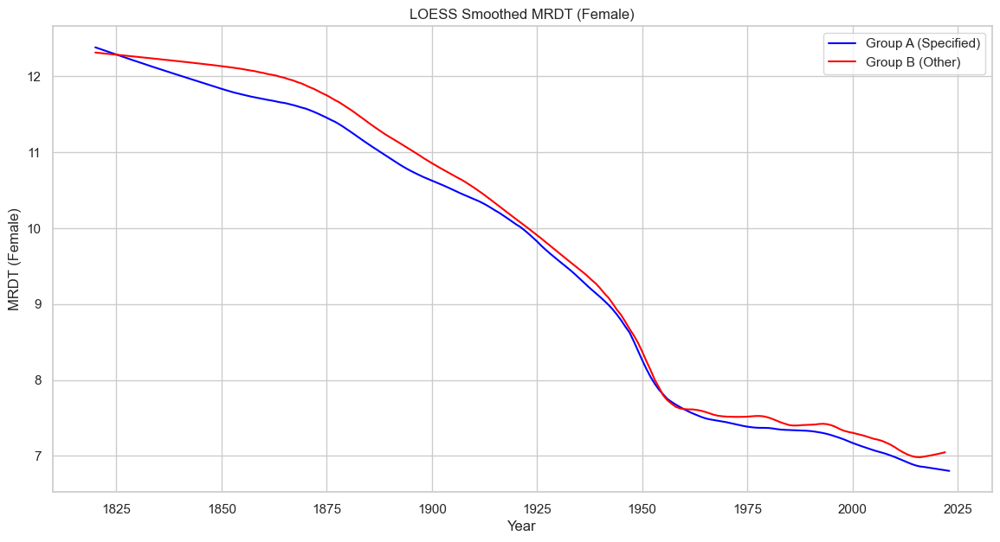

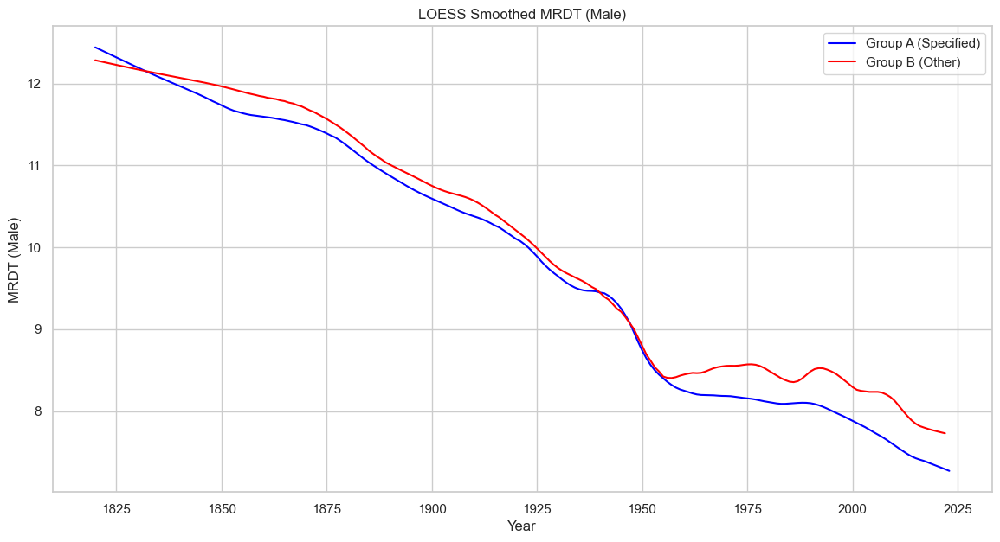

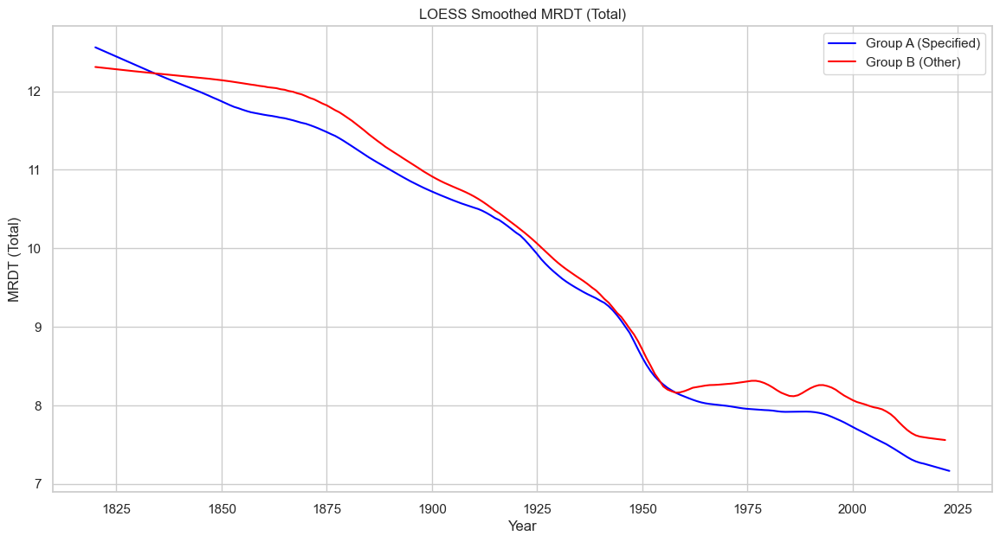

In [65]:
# Ensure there are no duplicate indices in the DataFrame
all_results_df = all_results_df.reset_index(drop=True)

# Function to fit LOESS and calculate residuals
def fit_loess_and_residuals(data, x, y):
    smoothed = lowess(data[y], data[x], frac=0.1)
    smoothed_values = pd.Series(smoothed[:, 1], index=smoothed[:, 0]).drop_duplicates()
    residuals = data[y] - smoothed_values.reindex(data[x].values).values
    return smoothed, residuals

# Fit LOESS and calculate residuals for MRDT (Female)
group_a_female_smoothed, group_a_female_residuals = fit_loess_and_residuals(all_results_df[all_results_df['Group'] == 'Specified'], 'Year', 'MRDT_Female')
group_b_female_smoothed, group_b_female_residuals = fit_loess_and_residuals(all_results_df[all_results_df['Group'] == 'Other'], 'Year', 'MRDT_Female')

# Fit LOESS and calculate residuals for MRDT (Male)
group_a_male_smoothed, group_a_male_residuals = fit_loess_and_residuals(all_results_df[all_results_df['Group'] == 'Specified'], 'Year', 'MRDT_Male')
group_b_male_smoothed, group_b_male_residuals = fit_loess_and_residuals(all_results_df[all_results_df['Group'] == 'Other'], 'Year', 'MRDT_Male')

# Fit LOESS and calculate residuals for MRDT (Total)
group_a_total_smoothed, group_a_total_residuals = fit_loess_and_residuals(all_results_df[all_results_df['Group'] == 'Specified'], 'Year', 'MRDT_Total')
group_b_total_smoothed, group_b_total_residuals = fit_loess_and_residuals(all_results_df[all_results_df['Group'] == 'Other'], 'Year', 'MRDT_Total')

# Perform t-tests on residuals to check for differences in trend lines
ttest_female = ttest_ind(group_a_female_residuals.dropna(), group_b_female_residuals.dropna())
ttest_male = ttest_ind(group_a_male_residuals.dropna(), group_b_male_residuals.dropna())
ttest_total = ttest_ind(group_a_total_residuals.dropna(), group_b_total_residuals.dropna())

print("T-Test Results for Differences in Trend Lines:")
print(f"MRDT (Female) p-value: {ttest_female.pvalue}")
print(f"MRDT (Male) p-value: {ttest_male.pvalue}")
print(f"MRDT (Total) p-value: {ttest_total.pvalue}")

# Plotting the LOESS smoothed trends and residuals

def plot_loess_smoothed(smoothed_a, smoothed_b, title, ylabel):
    plt.figure(figsize=(14, 7))
    plt.plot(smoothed_a[:, 0], smoothed_a[:, 1], label='Group A (Specified)', color='blue')
    plt.plot(smoothed_b[:, 0], smoothed_b[:, 1], label='Group B (Other)', color='red')
    plt.title(title)
    plt.xlabel('Year')
    plt.ylabel(ylabel)
    plt.legend()
    plt.show()

# Plot LOESS smoothed trends for MRDT (Female)
plot_loess_smoothed(group_a_female_smoothed, group_b_female_smoothed, 'LOESS Smoothed MRDT (Female)', 'MRDT (Female)')

# Plot LOESS smoothed trends for MRDT (Male)
plot_loess_smoothed(group_a_male_smoothed, group_b_male_smoothed, 'LOESS Smoothed MRDT (Male)', 'MRDT (Male)')

# Plot LOESS smoothed trends for MRDT (Total)
plot_loess_smoothed(group_a_total_smoothed, group_b_total_smoothed, 'LOESS Smoothed MRDT (Total)', 'MRDT (Total)')

### Hypothesis Testing
Performing additional statistical tests to compare the median values between the two groups.

Mann-Whitney U test for MRDT (Female): U-statistic=19445.5, P-value=0.288298122428187
Mann-Whitney U test for MRDT (Male): U-statistic=19298.5, P-value=0.23572245233317546
Mann-Whitney U test for MRDT (Total): U-statistic=19180.0, P-value=0.1985785026941136


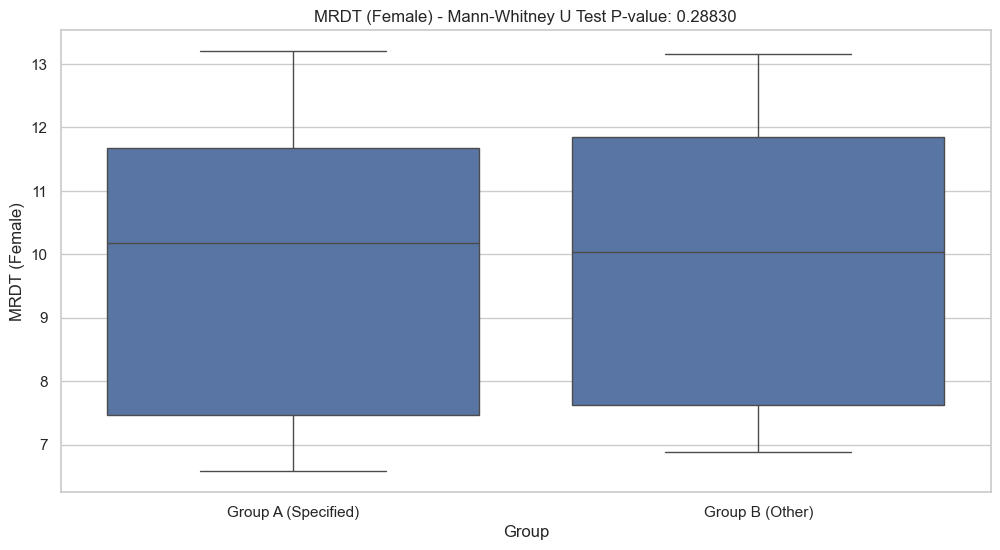

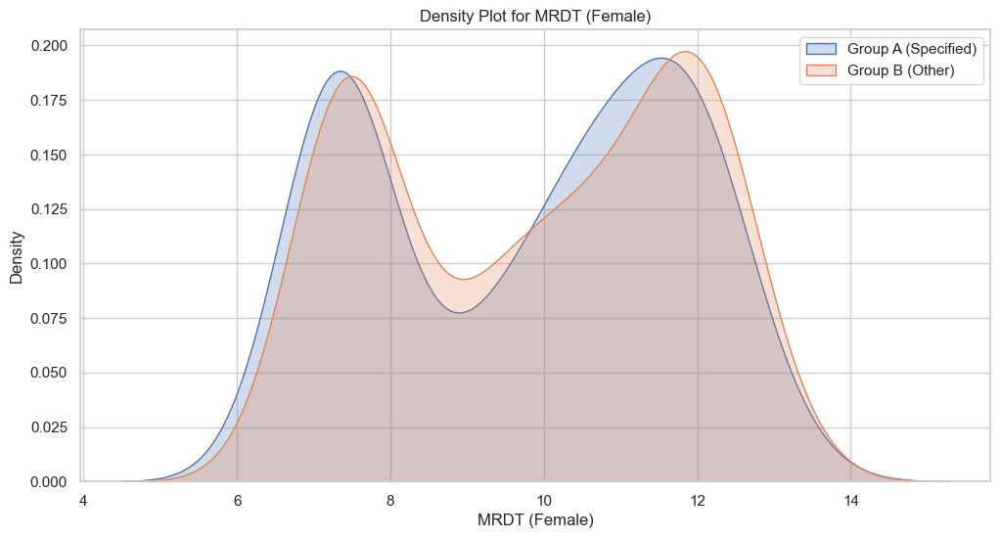

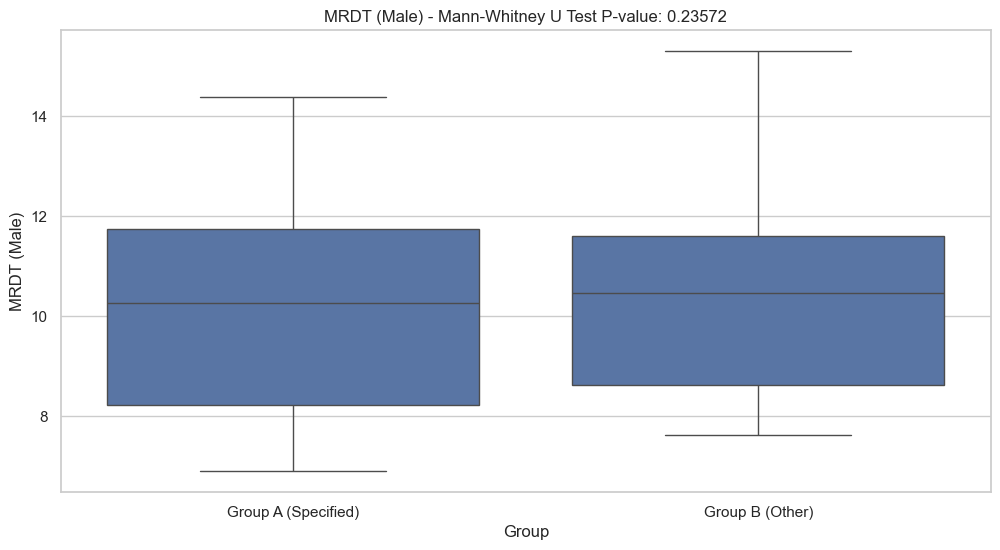

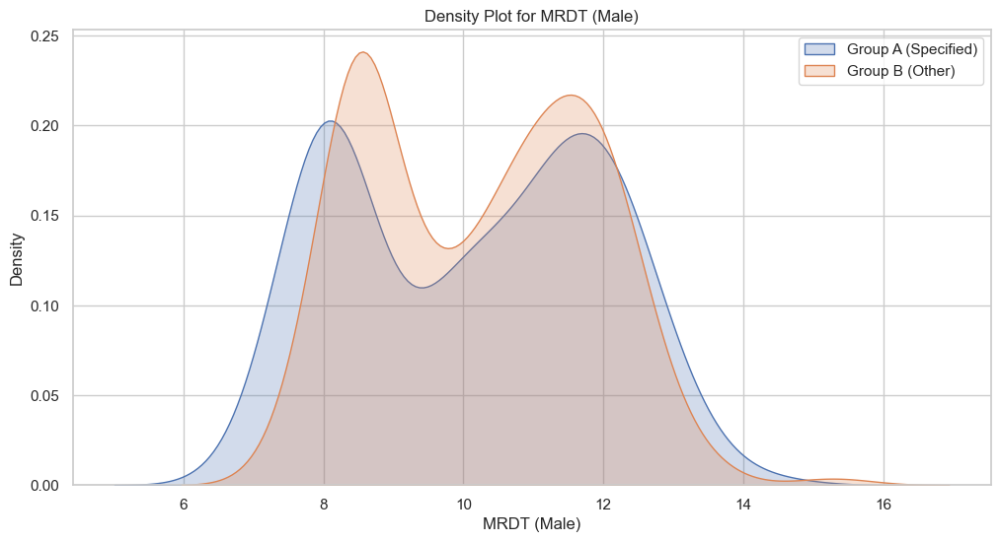

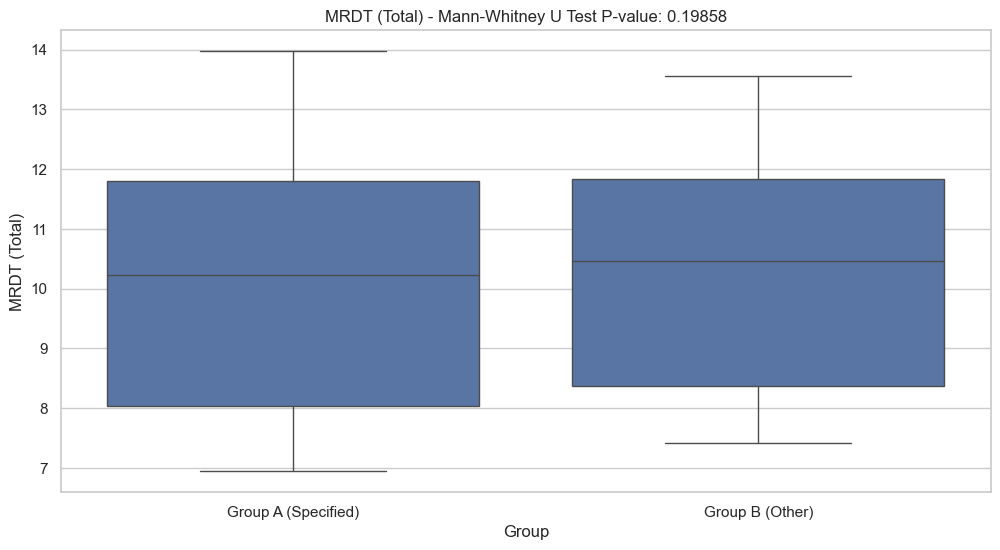

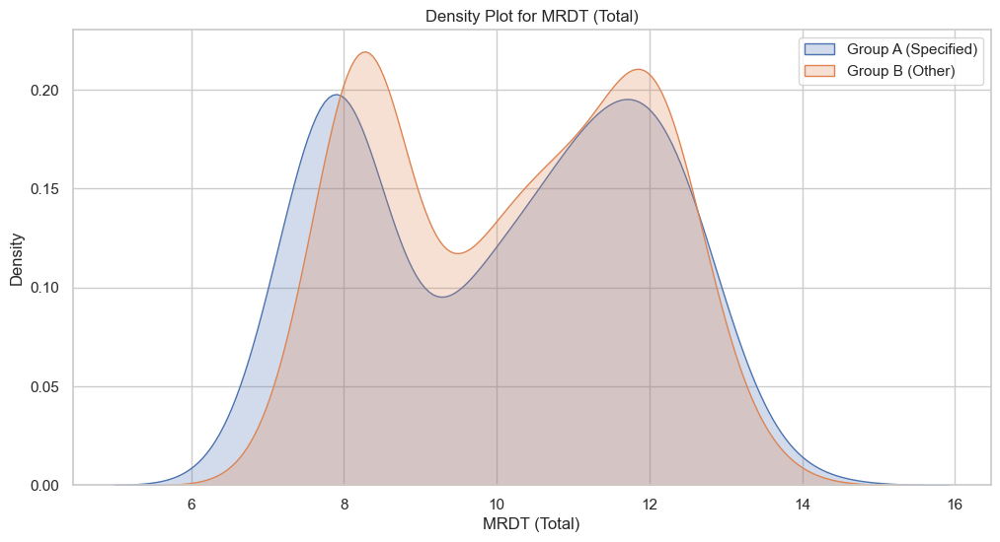

In [67]:
from scipy.stats import mannwhitneyu

# Perform Mann-Whitney U test for MRDT (Female)
u_stat_female, p_val_female = mannwhitneyu(specified_group_df['MRDT_Female'].dropna(), other_group_df['MRDT_Female'].dropna())
print(f"Mann-Whitney U test for MRDT (Female): U-statistic={u_stat_female}, P-value={p_val_female}")

# Perform Mann-Whitney U test for MRDT (Male)
u_stat_male, p_val_male = mannwhitneyu(specified_group_df['MRDT_Male'].dropna(), other_group_df['MRDT_Male'].dropna())
print(f"Mann-Whitney U test for MRDT (Male): U-statistic={u_stat_male}, P-value={p_val_male}")

# Perform Mann-Whitney U test for MRDT (Total)
u_stat_total, p_val_total = mannwhitneyu(specified_group_df['MRDT_Total'].dropna(), other_group_df['MRDT_Total'].dropna())
print(f"Mann-Whitney U test for MRDT (Total): U-statistic={u_stat_total}, P-value={p_val_total}")

# Visualization using box plots and density plots

# Combine the data into a single DataFrame for easier plotting
combined_df = pd.concat([
    specified_group_df.assign(Group='Group A (Specified)'),
    other_group_df.assign(Group='Group B (Other)')
])

# Boxplot for MRDT (Female)
plt.figure(figsize=(12, 6))
sns.boxplot(x='Group', y='MRDT_Female', data=combined_df)
plt.title(f'MRDT (Female) - Mann-Whitney U Test P-value: {p_val_female:.5f}')
plt.ylabel('MRDT (Female)')
plt.show()

# Density plot for MRDT (Female)
plt.figure(figsize=(12, 6))
sns.kdeplot(specified_group_df['MRDT_Female'].dropna(), label='Group A (Specified)', fill=True)
sns.kdeplot(other_group_df['MRDT_Female'].dropna(), label='Group B (Other)', fill=True)
plt.title('Density Plot for MRDT (Female)')
plt.xlabel('MRDT (Female)')
plt.ylabel('Density')
plt.legend()
plt.show()

# Boxplot for MRDT (Male)
plt.figure(figsize=(12, 6))
sns.boxplot(x='Group', y='MRDT_Male', data=combined_df)
plt.title(f'MRDT (Male) - Mann-Whitney U Test P-value: {p_val_male:.5f}')
plt.ylabel('MRDT (Male)')
plt.show()

# Density plot for MRDT (Male)
plt.figure(figsize=(12, 6))
sns.kdeplot(specified_group_df['MRDT_Male'].dropna(), label='Group A (Specified)', fill=True)
sns.kdeplot(other_group_df['MRDT_Male'].dropna(), label='Group B (Other)', fill=True)
plt.title('Density Plot for MRDT (Male)')
plt.xlabel('MRDT (Male)')
plt.ylabel('Density')
plt.legend()
plt.show()

# Boxplot for MRDT (Total)
plt.figure(figsize=(12, 6))
sns.boxplot(x='Group', y='MRDT_Total', data=combined_df)
plt.title(f'MRDT (Total) - Mann-Whitney U Test P-value: {p_val_total:.5f}')
plt.ylabel('MRDT (Total)')
plt.show()

# Density plot for MRDT (Total)
plt.figure(figsize=(12, 6))
sns.kdeplot(specified_group_df['MRDT_Total'].dropna(), label='Group A (Specified)', fill=True)
sns.kdeplot(other_group_df['MRDT_Total'].dropna(), label='Group B (Other)', fill=True)
plt.title('Density Plot for MRDT (Total)')
plt.xlabel('MRDT (Total)')
plt.ylabel('Density')
plt.legend()
plt.show()

### Subgroup Analysis
Further dividing the groups into subgroups based on regions or income levels and comparing MRDT among these subgroups.

### Temporal Trends
Investigating how MRDT has changed over specific periods within each group.

Mean MRDT from 1820 to 1900:
           MRDT_Female  MRDT_Male  MRDT_Total
Group                                        
Other        11.765134  11.580686   11.771448
Specified    11.563842  11.743362   11.750997
P-values from 1820 to 1900:
MRDT_Female: 0.00498
MRDT_Male: 0.10071
MRDT_Total: 0.80145


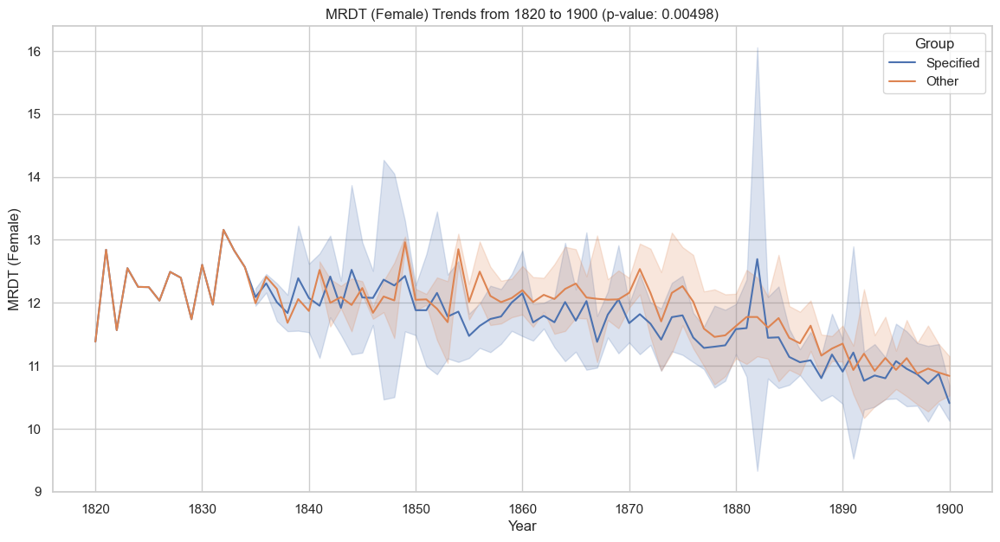

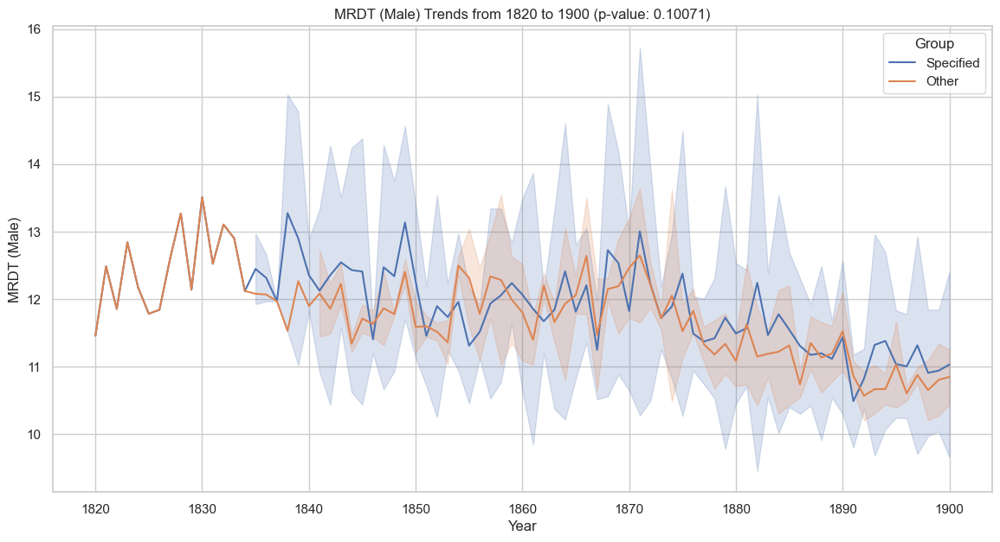

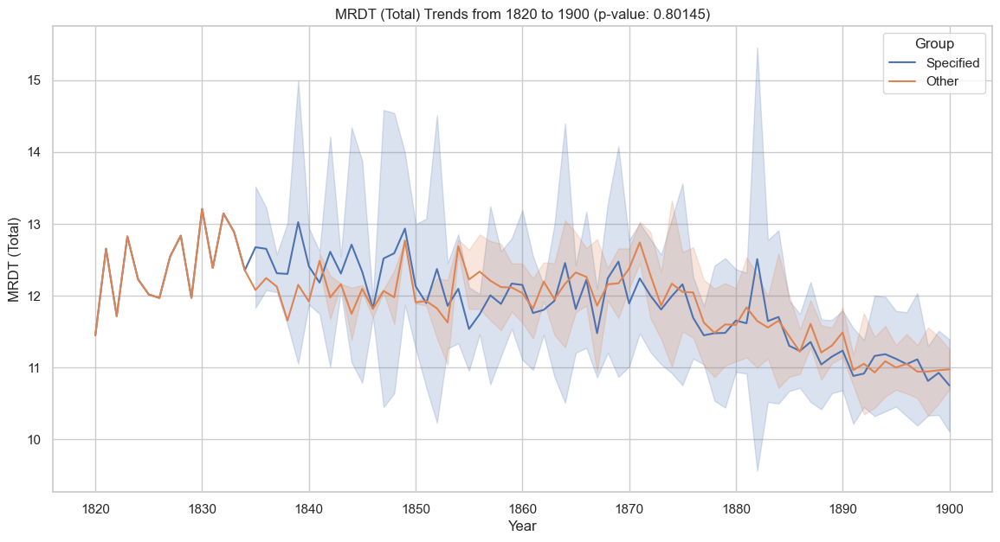

Mean MRDT from 1901 to 1950:
           MRDT_Female  MRDT_Male  MRDT_Total
Group                                        
Other         9.959729  10.318410   10.227963
Specified     9.875016  10.116313   10.109232
P-values from 1901 to 1950:
MRDT_Female: 0.27134
MRDT_Male: 0.06712
MRDT_Total: 0.18463


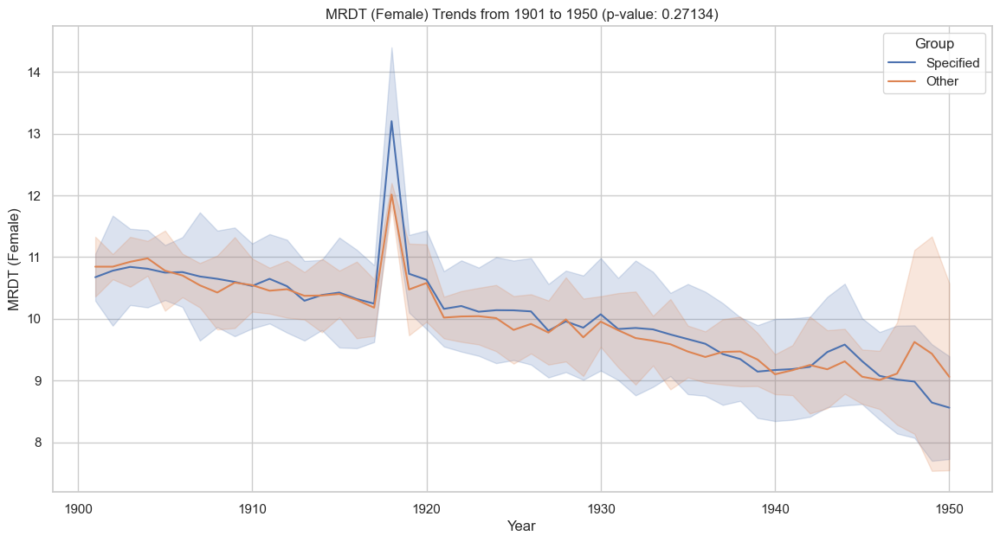

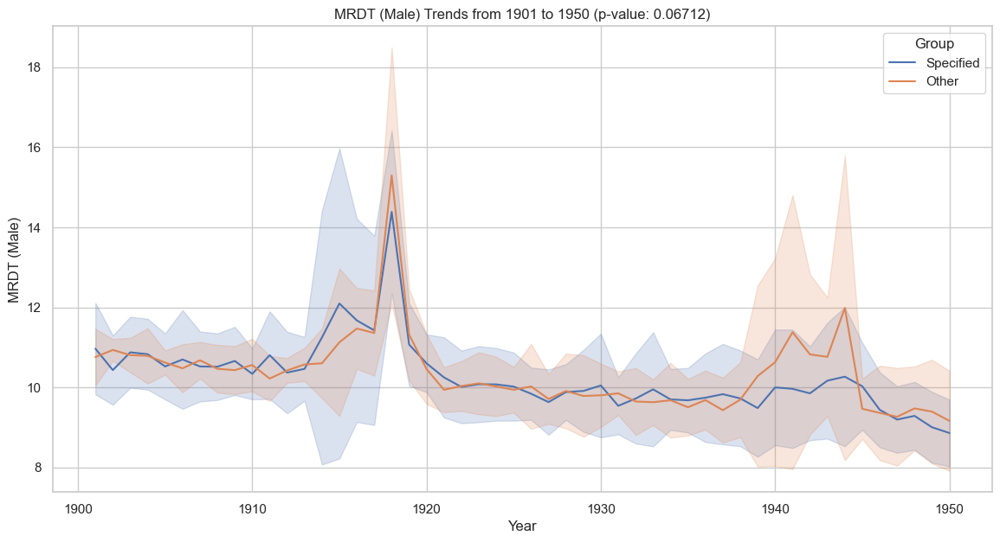

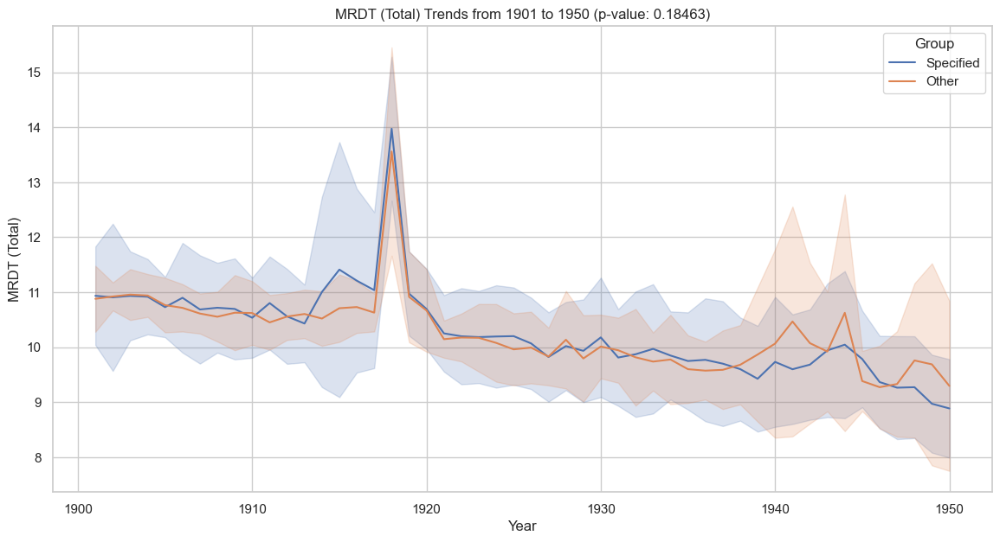

Mean MRDT from 1951 to 1980:
           MRDT_Female  MRDT_Male  MRDT_Total
Group                                        
Other         7.771773   8.621841    8.416751
Specified     7.624701   8.313345    8.136054
P-values from 1951 to 1980:
MRDT_Female: 0.00006
MRDT_Male: 0.00000
MRDT_Total: 0.00000


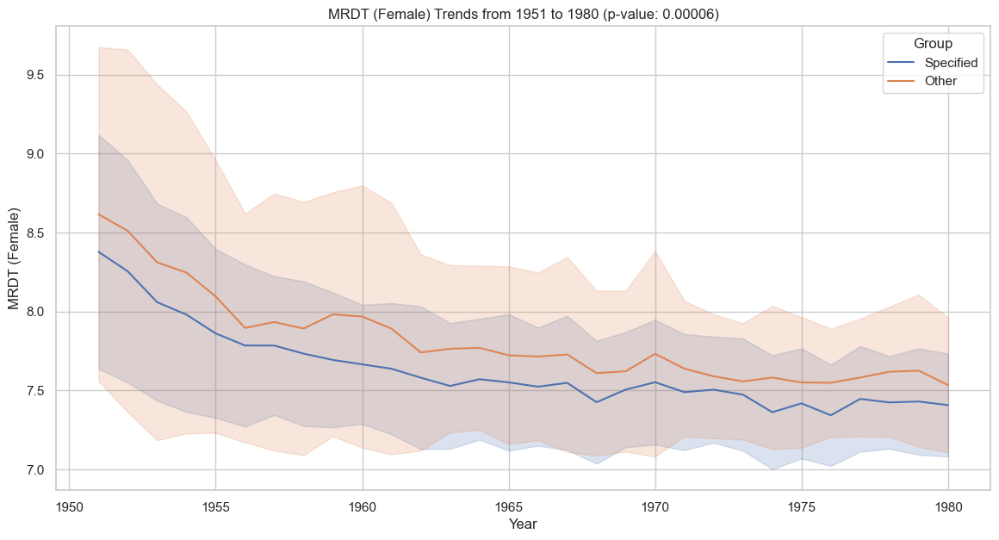

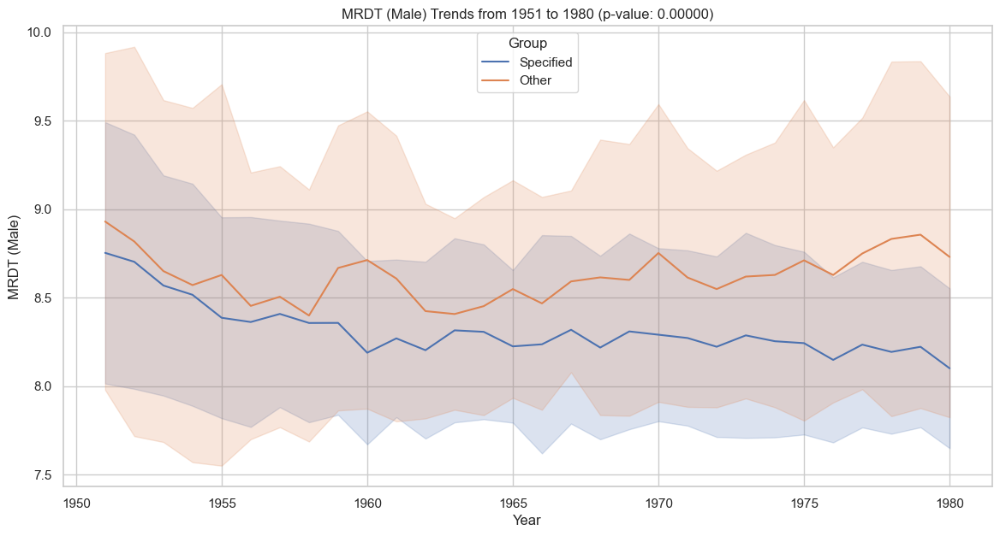

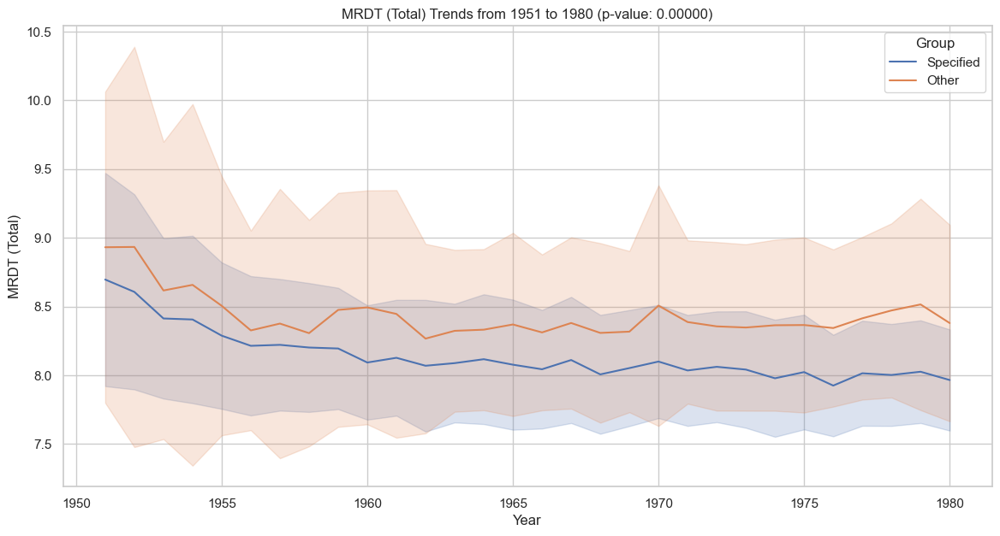

Mean MRDT from 1981 to 2000:
           MRDT_Female  MRDT_Male  MRDT_Total
Group                                        
Other         7.420433   8.529304    8.257941
Specified     7.311503   8.072558    7.895566
P-values from 1981 to 2000:
MRDT_Female: 0.00000
MRDT_Male: 0.00000
MRDT_Total: 0.00000


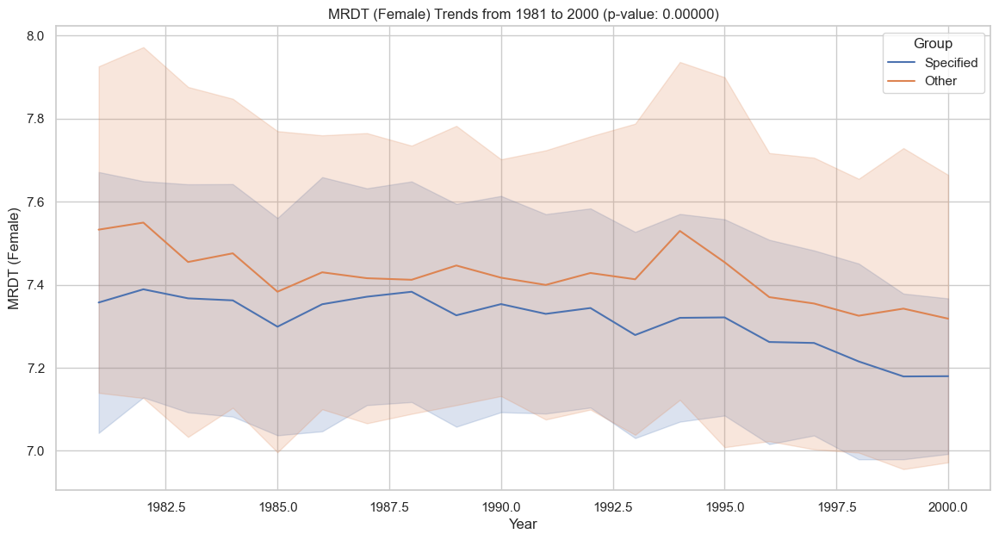

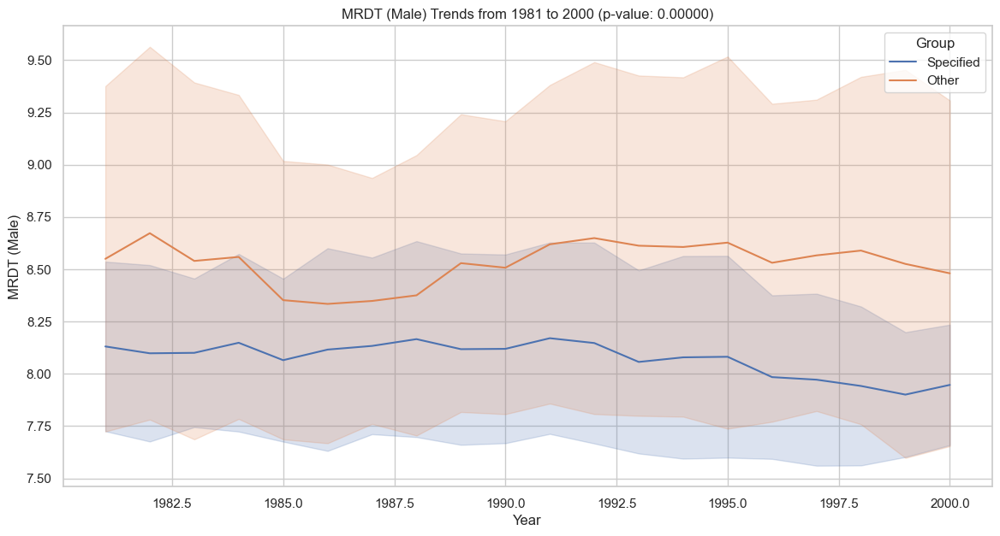

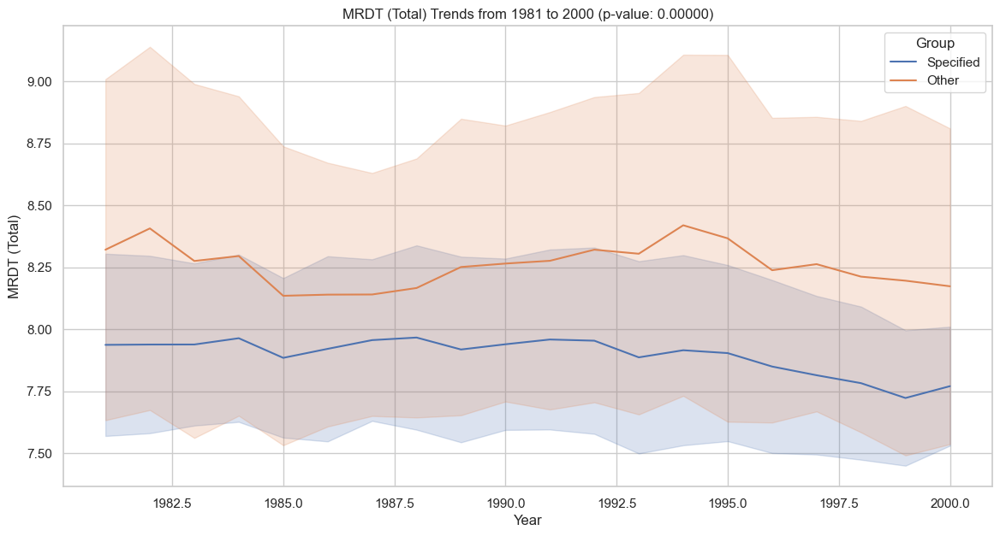

Mean MRDT from 2001 to 2020:
           MRDT_Female  MRDT_Male  MRDT_Total
Group                                        
Other         7.150244   8.174255    7.896377
Specified     7.003362   7.614353    7.464013
P-values from 2001 to 2020:
MRDT_Female: 0.00000
MRDT_Male: 0.00000
MRDT_Total: 0.00000


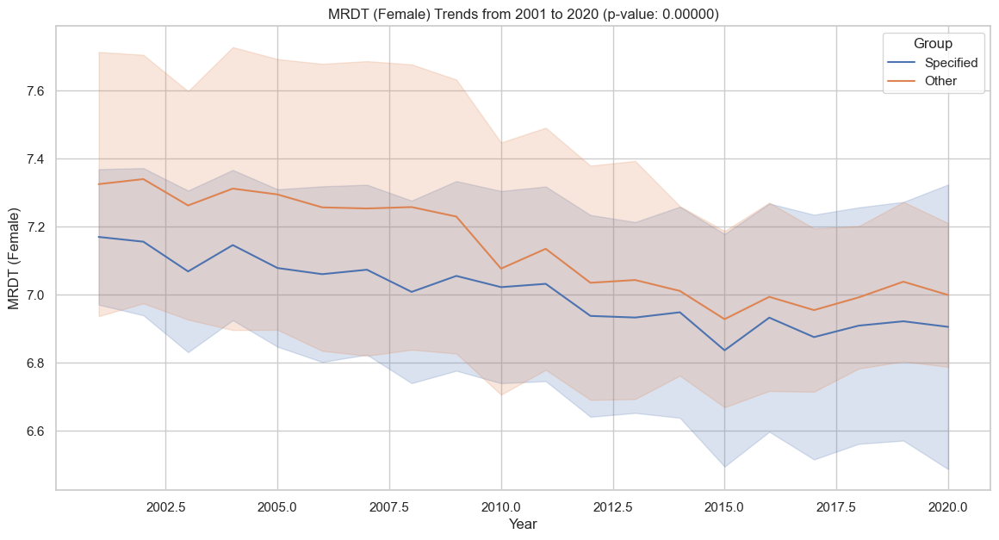

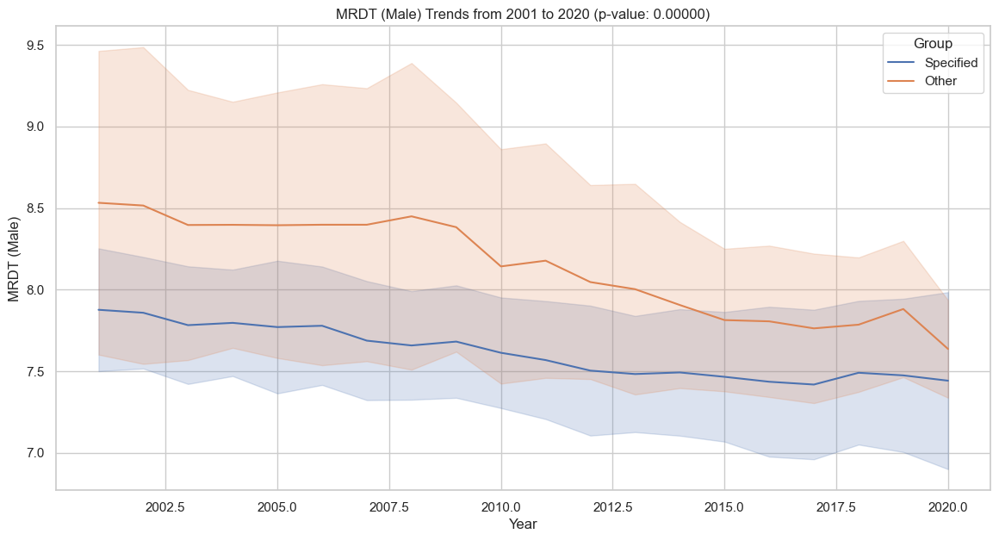

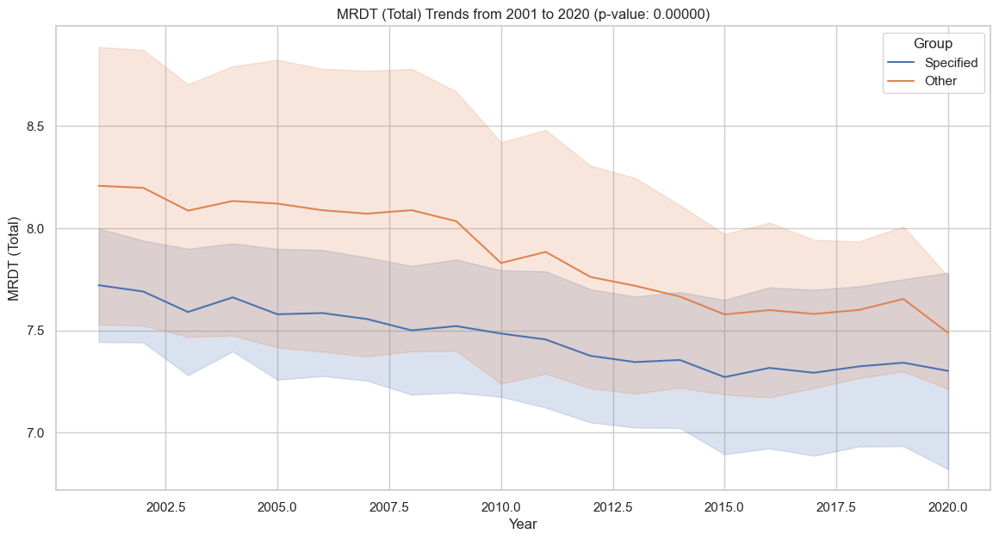

In [49]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind

# Define periods to analyze
periods = [(1820, 1900), (1901, 1950), (1951, 1980), (1981, 2000), (2001, 2020)]

# Helper function to calculate p-values
def calculate_p_values(df1, df2, column):
    ttest_result = ttest_ind(df1[column].dropna(), df2[column].dropna())
    return ttest_result.pvalue

# Analyze trends over these periods
for start_year, end_year in periods:
    period_df = combined_df[(combined_df['Year'] >= start_year) & (combined_df['Year'] <= end_year)]
    
    # Calculate mean MRDT for the period
    mean_mrdt_period = period_df.groupby('Group')[['MRDT_Female', 'MRDT_Male', 'MRDT_Total']].mean()
    print(f"Mean MRDT from {start_year} to {end_year}:")
    print(mean_mrdt_period)
    
    # Separate specified and other groups
    specified_group = period_df[period_df['Group'] == 'Specified']
    other_group = period_df[period_df['Group'] == 'Other']
    
    # Calculate p-values for the period
    p_value_female = calculate_p_values(specified_group, other_group, 'MRDT_Female')
    p_value_male = calculate_p_values(specified_group, other_group, 'MRDT_Male')
    p_value_total = calculate_p_values(specified_group, other_group, 'MRDT_Total')
    
    print(f"P-values from {start_year} to {end_year}:")
    print(f"MRDT_Female: {p_value_female:.5f}")
    print(f"MRDT_Male: {p_value_male:.5f}")
    print(f"MRDT_Total: {p_value_total:.5f}")

    # Plot MRDT trends for the period
    plt.figure(figsize=(14, 7))
    sns.lineplot(data=period_df, x='Year', y='MRDT_Female', hue='Group', errorbar='sd')
    plt.title(f'MRDT (Female) Trends from {start_year} to {end_year} (p-value: {p_value_female:.5f})')
    plt.xlabel('Year')
    plt.ylabel('MRDT (Female)')
    plt.legend(title='Group')
    plt.show()
    
    plt.figure(figsize=(14, 7))
    sns.lineplot(data=period_df, x='Year', y='MRDT_Male', hue='Group', errorbar='sd')
    plt.title(f'MRDT (Male) Trends from {start_year} to {end_year} (p-value: {p_value_male:.5f})')
    plt.xlabel('Year')
    plt.ylabel('MRDT (Male)')
    plt.legend(title='Group')
    plt.show()

    plt.figure(figsize=(14, 7))
    sns.lineplot(data=period_df, x='Year', y='MRDT_Total', hue='Group', errorbar='sd')
    plt.title(f'MRDT (Total) Trends from {start_year} to {end_year} (p-value: {p_value_total:.5f})')
    plt.xlabel('Year')
    plt.ylabel('MRDT (Total)')
    plt.legend(title='Group')
    plt.show()


In [50]:
# Calculate summary statistics for specified and other groups
summary_stats_specified = specified_group_df[['MRDT_Female', 'MRDT_Male', 'MRDT_Total']].describe()
summary_stats_other = other_group_df[['MRDT_Female', 'MRDT_Male', 'MRDT_Total']].describe()

print("Summary Statistics for Specified Group:")
print(summary_stats_specified)

print("\nSummary Statistics for Other Group:")
print(summary_stats_other)


Summary Statistics for Specified Group:
       MRDT_Female    MRDT_Male   MRDT_Total
count  2374.000000  2374.000000  2374.000000
mean      8.713076     9.199237     9.101370
std       1.854757     1.782451     1.771031
min       6.371997     6.679820     6.582370
25%       7.212210     7.846269     7.711084
50%       7.763308     8.525500     8.316957
75%      10.340320    10.372512    10.463641
max      20.857709    21.230570    19.729656

Summary Statistics for Other Group:
       MRDT_Female    MRDT_Male   MRDT_Total
count  1646.000000  1646.000000  1646.000000
mean      8.406350     9.144533     8.976737
std       1.691818     1.482408     1.506068
min       6.401734     6.955644     6.896571
25%       7.230312     8.024056     7.852577
50%       7.615850     8.642045     8.363596
75%       9.374238    10.021094     9.768153
max      13.453271    20.397941    16.800309


Group counts:
Group
Specified    2374
Other        1646
Name: count, dtype: int64
  Country  Year  MRDT_Female  MRDT_Male  MRDT_Total  MRDT_Female_Change  \
0     AUS  1921    10.292171  10.832710   10.601896                 NaN   
1     AUS  1922    10.067625  10.061659   10.037259           -0.021817   
2     AUS  1923     9.916260  10.074425   10.135118           -0.015035   
3     AUS  1924     9.741479  10.118925   10.116418           -0.017626   
4     AUS  1925     9.768675  10.141951   10.328338            0.002792   

   MRDT_Male_Change  MRDT_Total_Change      Group  
0               NaN                NaN  Specified  
1         -0.071178          -0.053258  Specified  
2          0.001269           0.009750  Specified  
3          0.004417          -0.001845  Specified  
4          0.002276           0.020948  Specified  


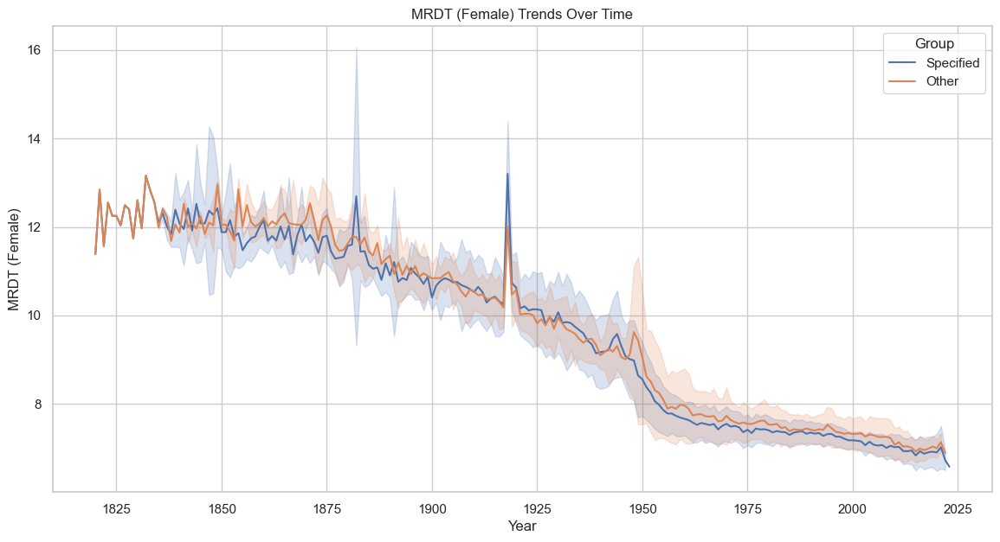

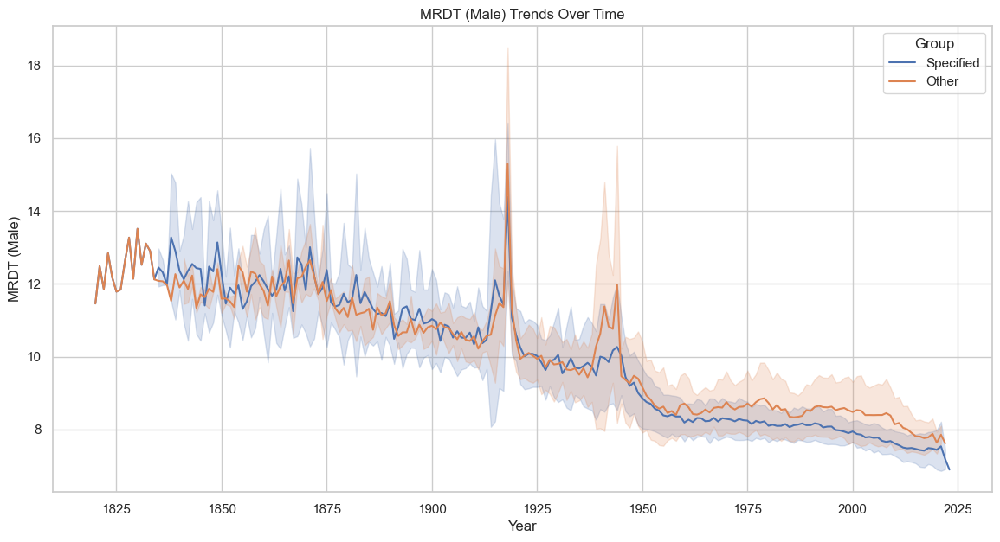

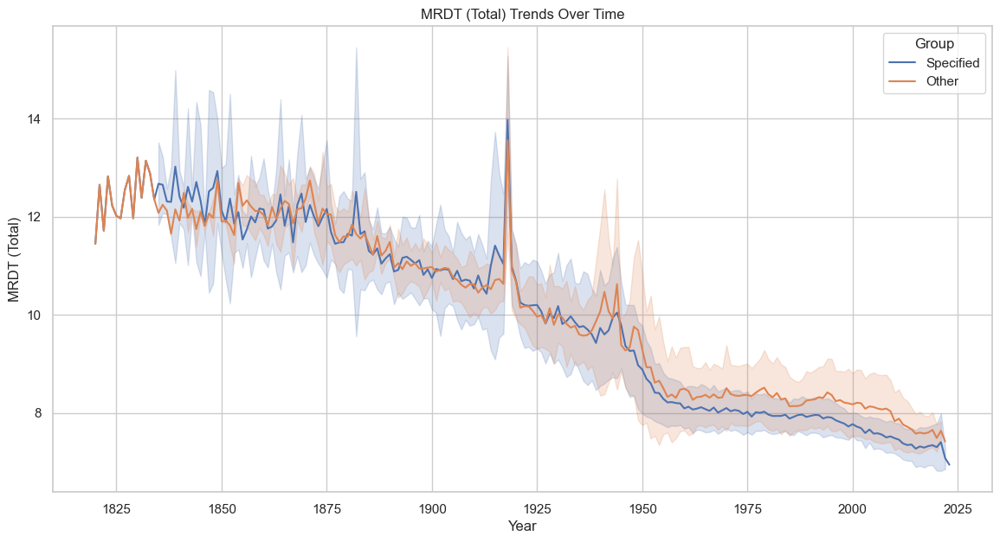

In [51]:
# Combine specified and other groups into one DataFrame for plotting
combined_df = pd.concat([specified_group_df.assign(Group='Specified'), 
                         other_group_df.assign(Group='Other')])

# Verify the categorization
print("Group counts:")
print(combined_df['Group'].value_counts())

# Print a few rows to verify the data
print(combined_df.head())

# Plot trends over time for both groups on the same graph
plt.figure(figsize=(14, 7))
sns.lineplot(data=combined_df, x='Year', y='MRDT_Female', hue='Group', errorbar='sd')
plt.title('MRDT (Female) Trends Over Time')
plt.xlabel('Year')
plt.ylabel('MRDT (Female)')
plt.legend(title='Group')
plt.show()

plt.figure(figsize=(14, 7))
sns.lineplot(data=combined_df, x='Year', y='MRDT_Male', hue='Group', errorbar='sd')
plt.title('MRDT (Male) Trends Over Time')
plt.xlabel('Year')
plt.ylabel('MRDT (Male)')
plt.legend(title='Group')
plt.show()

plt.figure(figsize=(14, 7))
sns.lineplot(data=combined_df, x='Year', y='MRDT_Total', hue='Group', errorbar='sd')
plt.title('MRDT (Total) Trends Over Time')
plt.xlabel('Year')
plt.ylabel('MRDT (Total)')
plt.legend(title='Group')
plt.show()


In [52]:
# Perform t-tests to compare the differences between the two groups
ttest_results_female = ttest_ind(specified_group_df['MRDT_Female'].dropna(), other_group_df['MRDT_Female'].dropna())
ttest_results_male = ttest_ind(specified_group_df['MRDT_Male'].dropna(), other_group_df['MRDT_Male'].dropna())
ttest_results_total = ttest_ind(specified_group_df['MRDT_Total'].dropna(), other_group_df['MRDT_Total'].dropna())

print("T-test results for MRDT (Female):", ttest_results_female)
print("T-test results for MRDT (Male):", ttest_results_male)
print("T-test results for MRDT (Total):", ttest_results_total)

# Perform Mann-Whitney U test for medians
from scipy.stats import mannwhitneyu

# Mann-Whitney U test for MRDT (Female)
u_stat_female, p_val_female = mannwhitneyu(specified_group_df['MRDT_Female'].dropna(), other_group_df['MRDT_Female'].dropna())
print(f"Mann-Whitney U test for MRDT (Female): U-statistic={u_stat_female}, P-value={p_val_female}")

# Mann-Whitney U test for MRDT (Male)
u_stat_male, p_val_male = mannwhitneyu(specified_group_df['MRDT_Male'].dropna(), other_group_df['MRDT_Male'].dropna())
print(f"Mann-Whitney U test for MRDT (Male): U-statistic={u_stat_male}, P-value={p_val_male}")

# Mann-Whitney U test for MRDT (Total)
u_stat_total, p_val_total = mannwhitneyu(specified_group_df['MRDT_Total'].dropna(), other_group_df['MRDT_Total'].dropna())
print(f"Mann-Whitney U test for MRDT (Total): U-statistic={u_stat_total}, P-value={p_val_total}")


T-test results for MRDT (Female): TtestResult(statistic=5.342914591932344, pvalue=9.653450577096332e-08, df=4018.0)
T-test results for MRDT (Male): TtestResult(statistic=1.0236358872018154, pvalue=0.30606891186343427, df=4018.0)
T-test results for MRDT (Total): TtestResult(statistic=2.330077170799574, pvalue=0.01985134738693202, df=4018.0)
Mann-Whitney U test for MRDT (Female): U-statistic=2078856.5, P-value=0.0005483820571498754
Mann-Whitney U test for MRDT (Male): U-statistic=1875621.0, P-value=0.030729179264473733
Mann-Whitney U test for MRDT (Total): U-statistic=1925988.5, P-value=0.442114229964375


In [53]:
# Selecting only numeric columns for correlation calculation
numeric_cols_specified = specified_group_df.select_dtypes(include=[np.number])
numeric_cols_other = other_group_df.select_dtypes(include=[np.number])

# Correlation for Specified Group
corr_specified = numeric_cols_specified.corr()
print("Correlation Matrix for Specified Group:")
print(corr_specified)

# Correlation for Other Group
corr_other = numeric_cols_other.corr()
print("Correlation Matrix for Other Group:")
print(corr_other)


Correlation Matrix for Specified Group:
                        Year  MRDT_Female  MRDT_Male  MRDT_Total  \
Year                1.000000    -0.919063  -0.840163   -0.888679   
MRDT_Female        -0.919063     1.000000   0.916727    0.974981   
MRDT_Male          -0.840163     0.916727   1.000000    0.975633   
MRDT_Total         -0.888679     0.974981   0.975633    1.000000   
MRDT_Female_Change -0.097173     0.193781   0.152549    0.181900   
MRDT_Male_Change   -0.090232     0.133237   0.246481    0.184292   
MRDT_Total_Change  -0.097553     0.173277   0.202010    0.201352   

                    MRDT_Female_Change  MRDT_Male_Change  MRDT_Total_Change  
Year                         -0.097173         -0.090232          -0.097553  
MRDT_Female                   0.193781          0.133237           0.173277  
MRDT_Male                     0.152549          0.246481           0.202010  
MRDT_Total                    0.181900          0.184292           0.201352  
MRDT_Female_Change       

Mean MRDT from 1820 to 1900:
           MRDT_Female  MRDT_Male  MRDT_Total
Group                                        
Other        11.765134  11.580686   11.771448
Specified    11.563842  11.743362   11.750997
P-values from 1820 to 1900:
MRDT_Female: 0.00498
MRDT_Male: 0.10071
MRDT_Total: 0.80145


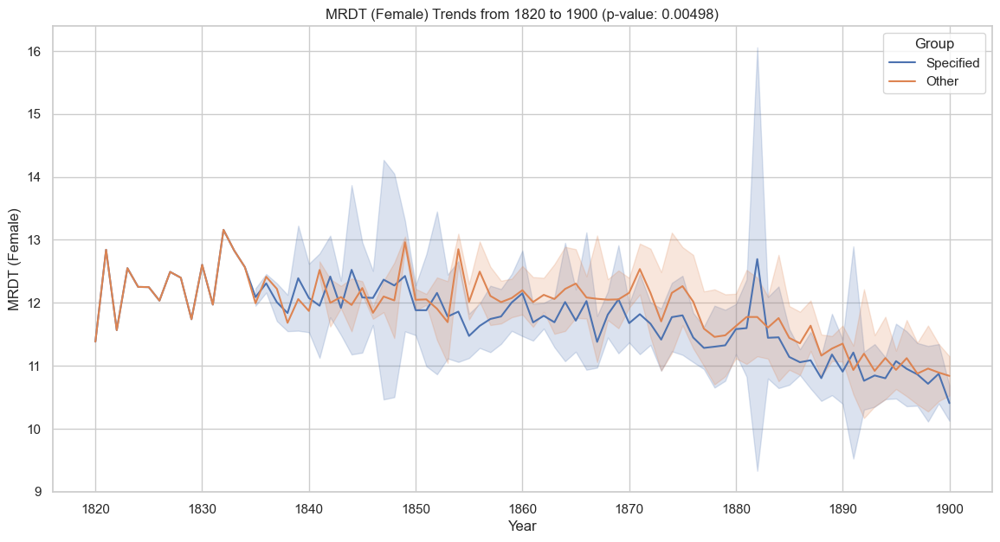

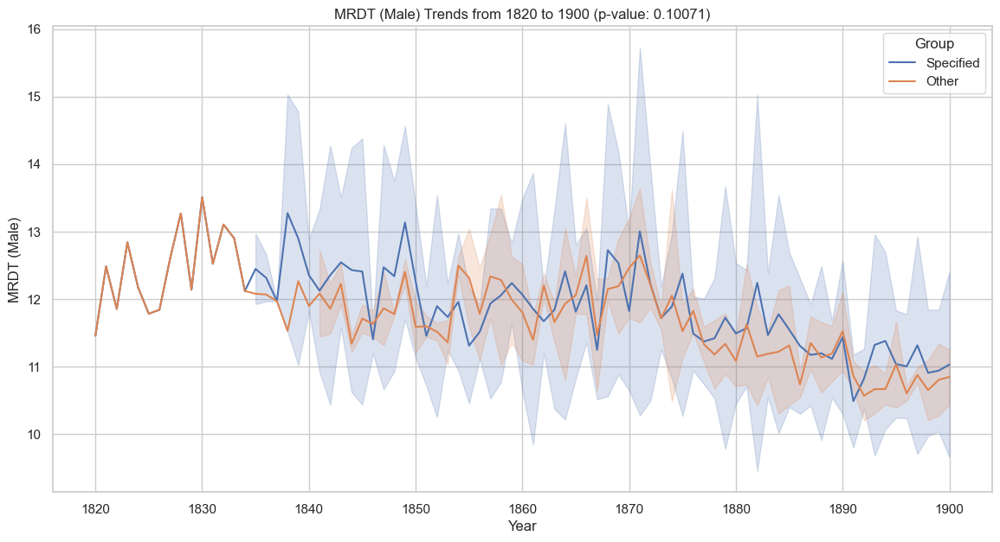

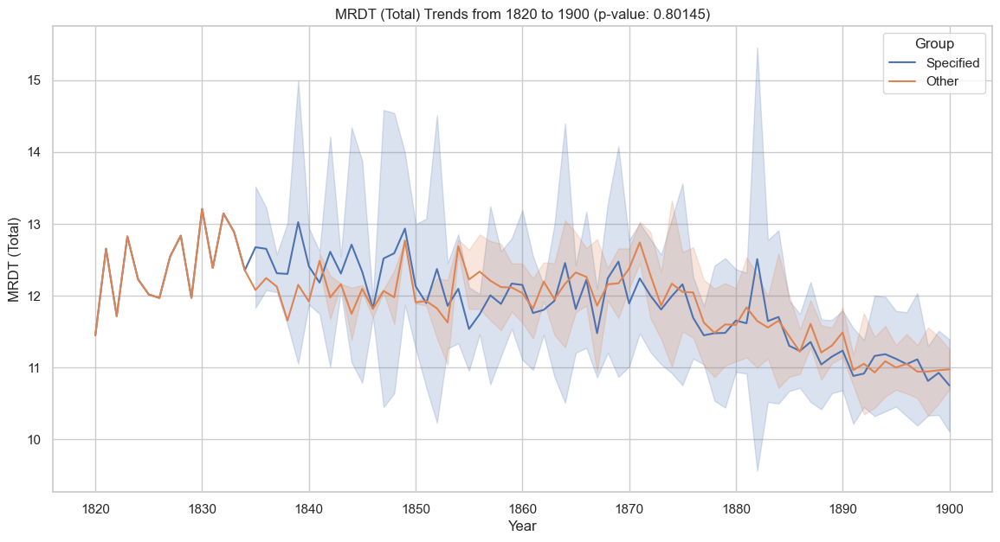

Mean MRDT from 1901 to 1950:
           MRDT_Female  MRDT_Male  MRDT_Total
Group                                        
Other         9.959729  10.318410   10.227963
Specified     9.875016  10.116313   10.109232
P-values from 1901 to 1950:
MRDT_Female: 0.27134
MRDT_Male: 0.06712
MRDT_Total: 0.18463


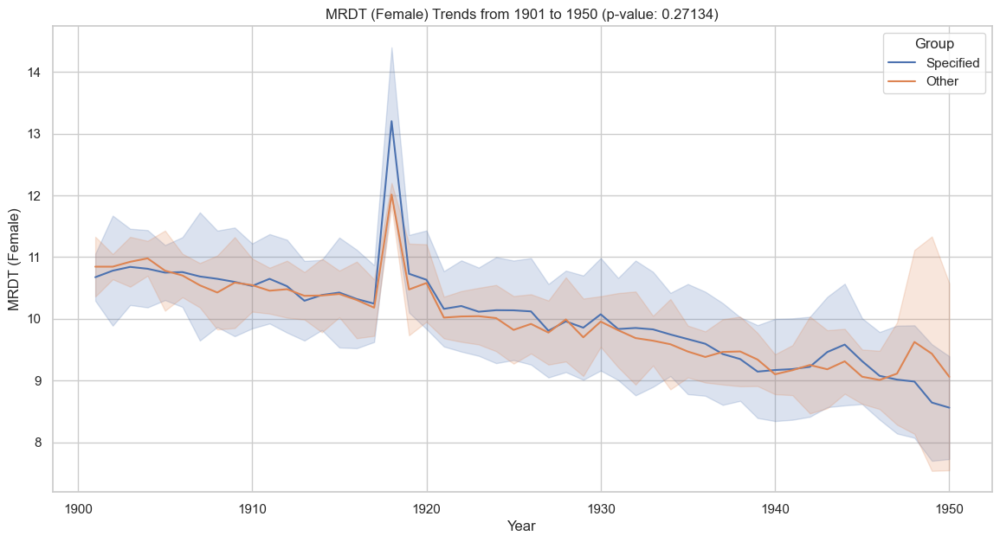

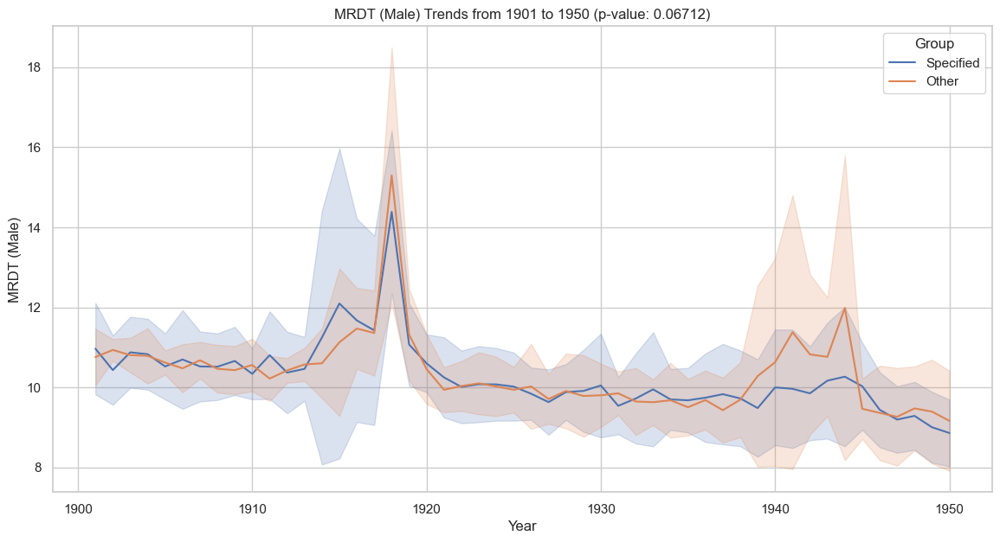

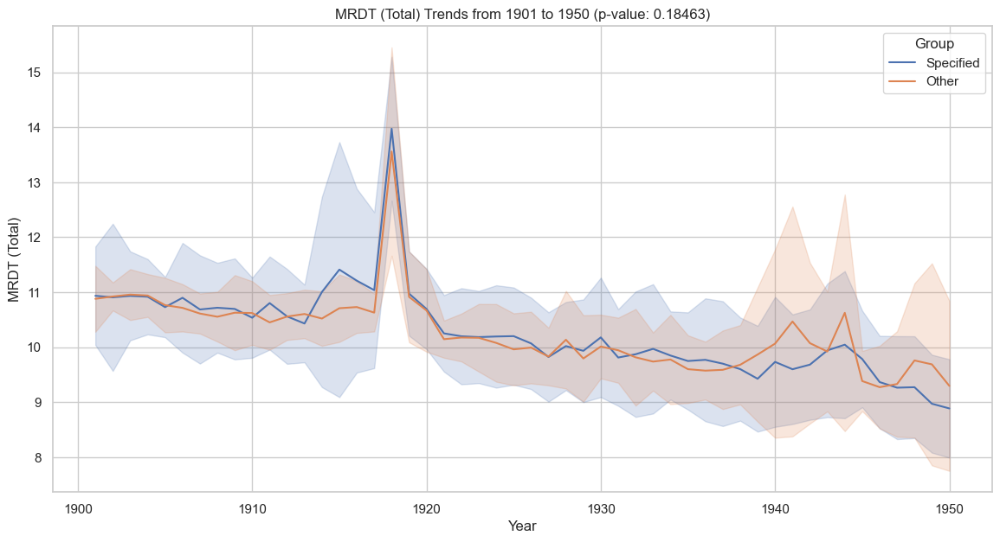

Mean MRDT from 1951 to 1980:
           MRDT_Female  MRDT_Male  MRDT_Total
Group                                        
Other         7.771773   8.621841    8.416751
Specified     7.624701   8.313345    8.136054
P-values from 1951 to 1980:
MRDT_Female: 0.00006
MRDT_Male: 0.00000
MRDT_Total: 0.00000


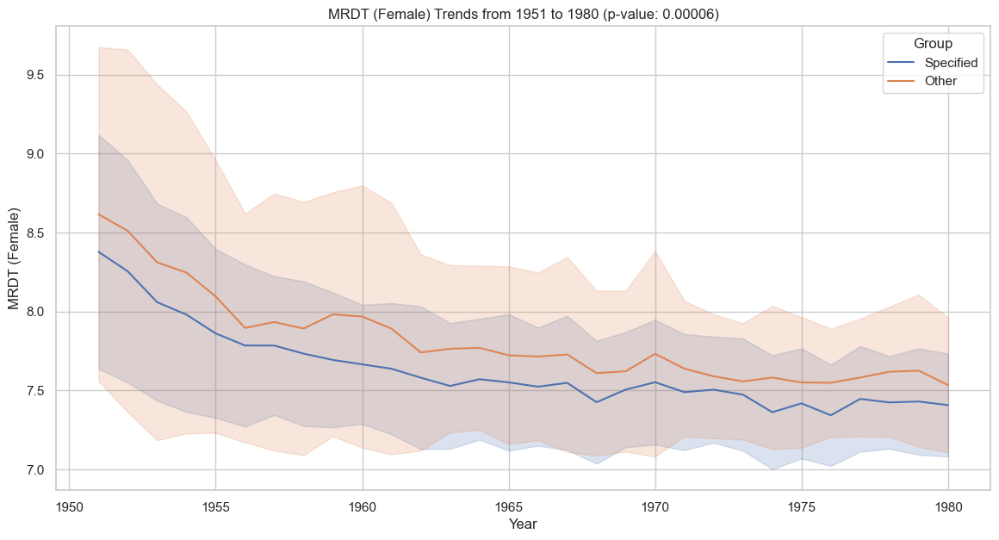

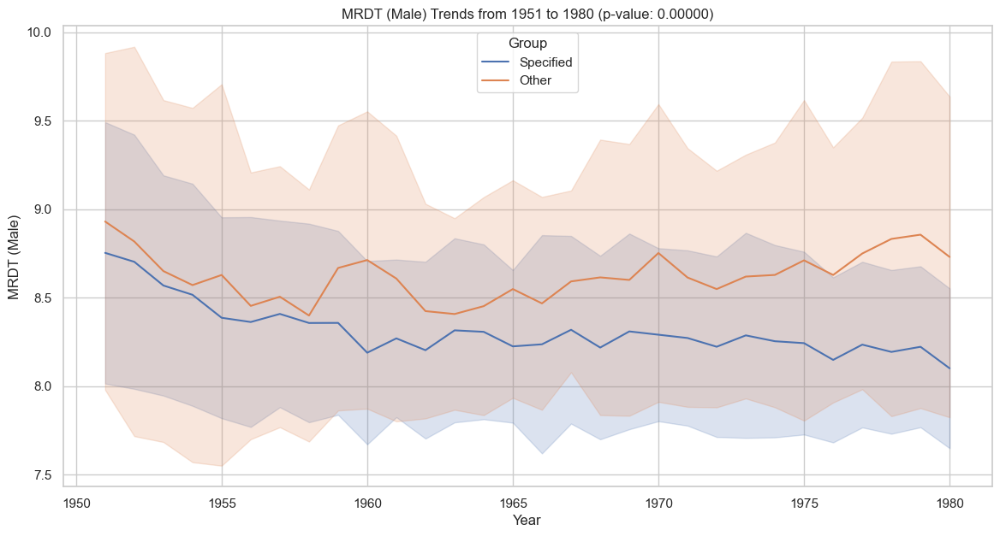

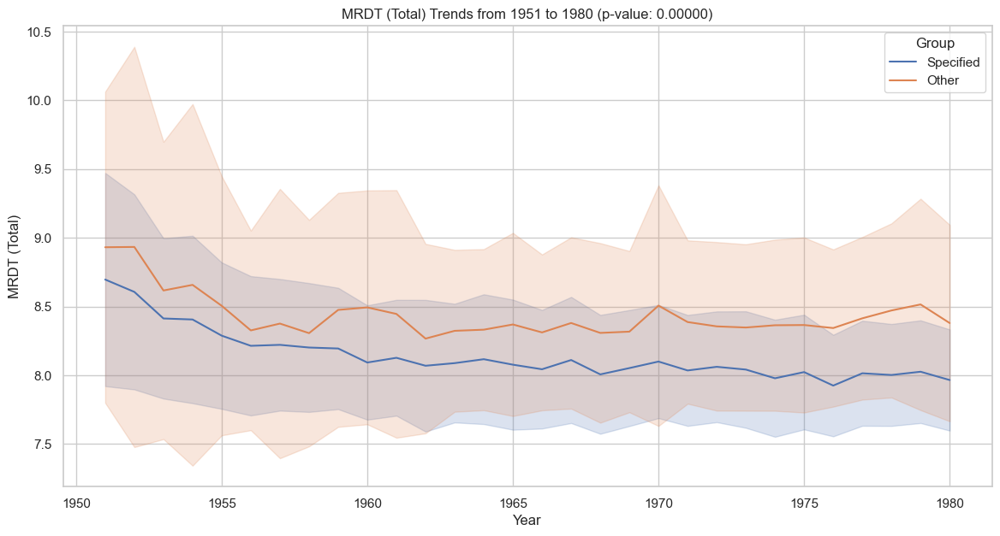

Mean MRDT from 1981 to 2000:
           MRDT_Female  MRDT_Male  MRDT_Total
Group                                        
Other         7.420433   8.529304    8.257941
Specified     7.311503   8.072558    7.895566
P-values from 1981 to 2000:
MRDT_Female: 0.00000
MRDT_Male: 0.00000
MRDT_Total: 0.00000


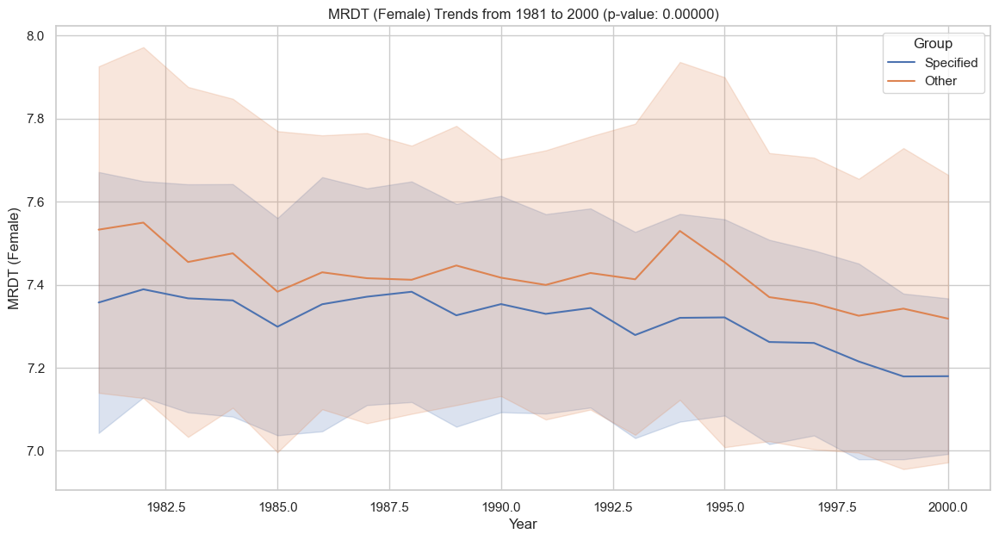

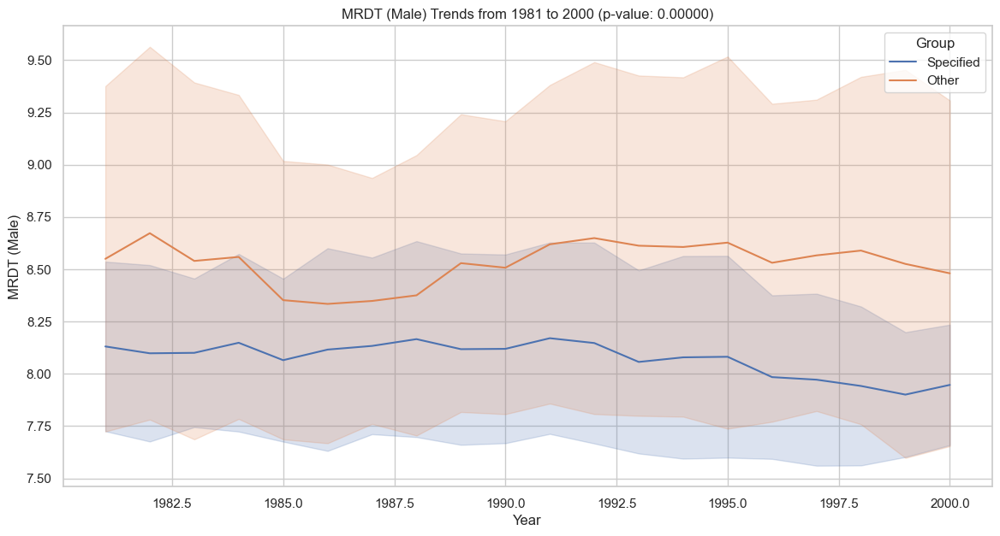

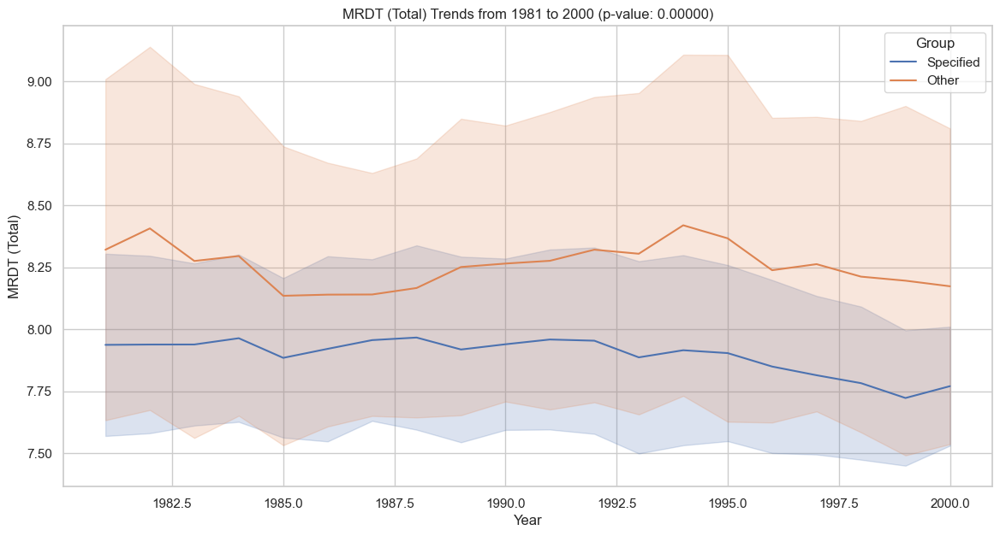

Mean MRDT from 2001 to 2020:
           MRDT_Female  MRDT_Male  MRDT_Total
Group                                        
Other         7.150244   8.174255    7.896377
Specified     7.003362   7.614353    7.464013
P-values from 2001 to 2020:
MRDT_Female: 0.00000
MRDT_Male: 0.00000
MRDT_Total: 0.00000


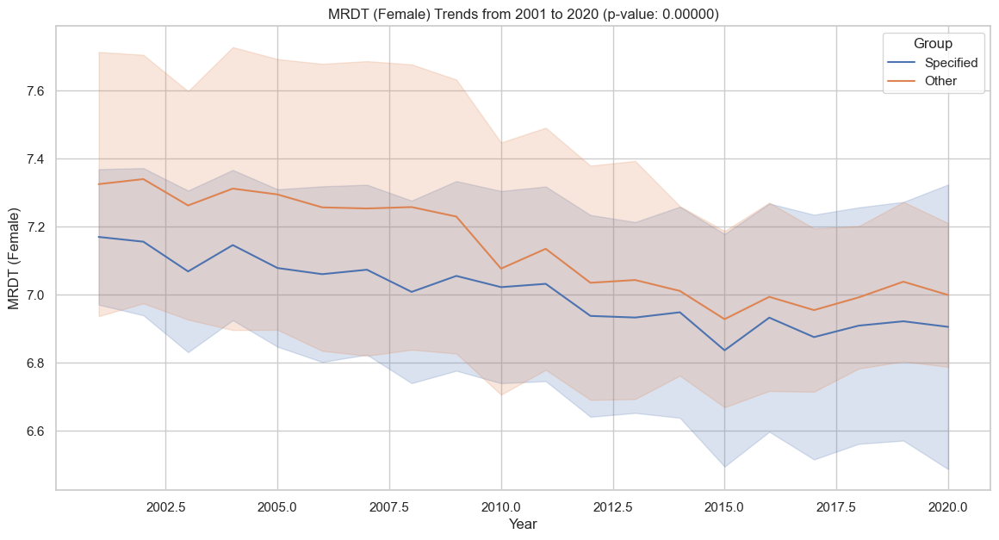

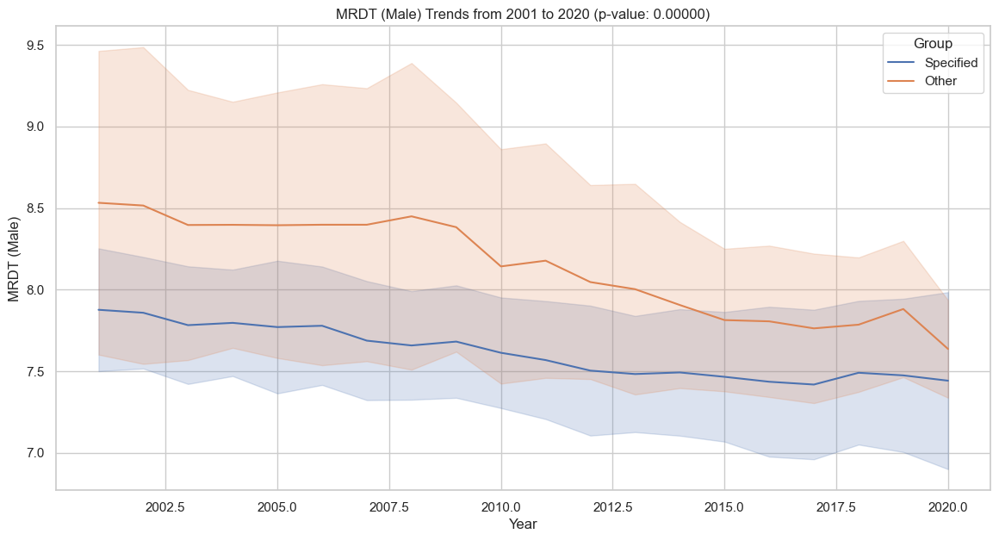

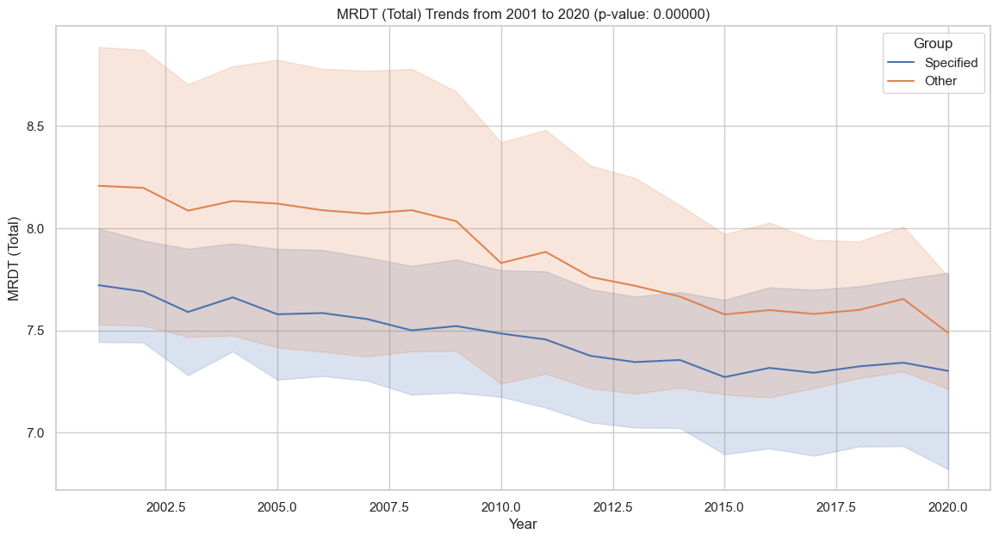

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind

# Define periods to analyze
periods = [(1820, 1900), (1901, 1950), (1951, 1980), (1981, 2000), (2001, 2020)]

# Helper function to calculate p-values
def calculate_p_values(df1, df2, column):
    ttest_result = ttest_ind(df1[column].dropna(), df2[column].dropna())
    return ttest_result.pvalue

# Analyze trends over these periods
for start_year, end_year in periods:
    period_df = combined_df[(combined_df['Year'] >= start_year) & (combined_df['Year'] <= end_year)]
    
    # Calculate mean MRDT for the period
    mean_mrdt_period = period_df.groupby('Group')[['MRDT_Female', 'MRDT_Male', 'MRDT_Total']].mean()
    print(f"Mean MRDT from {start_year} to {end_year}:")
    print(mean_mrdt_period)
    
    # Separate specified and other groups
    specified_group = period_df[period_df['Group'] == 'Specified']
    other_group = period_df[period_df['Group'] == 'Other']
    
    # Calculate p-values for the period
    p_value_female = calculate_p_values(specified_group, other_group, 'MRDT_Female')
    p_value_male = calculate_p_values(specified_group, other_group, 'MRDT_Male')
    p_value_total = calculate_p_values(specified_group, other_group, 'MRDT_Total')
    
    print(f"P-values from {start_year} to {end_year}:")
    print(f"MRDT_Female: {p_value_female:.5f}")
    print(f"MRDT_Male: {p_value_male:.5f}")
    print(f"MRDT_Total: {p_value_total:.5f}")

    # Plot MRDT trends for the period
    plt.figure(figsize=(14, 7))
    sns.lineplot(data=period_df, x='Year', y='MRDT_Female', hue='Group', errorbar='sd')
    plt.title(f'MRDT (Female) Trends from {start_year} to {end_year} (p-value: {p_value_female:.5f})')
    plt.xlabel('Year')
    plt.ylabel('MRDT (Female)')
    plt.legend(title='Group')
    plt.show()
    
    plt.figure(figsize=(14, 7))
    sns.lineplot(data=period_df, x='Year', y='MRDT_Male', hue='Group', errorbar='sd')
    plt.title(f'MRDT (Male) Trends from {start_year} to {end_year} (p-value: {p_value_male:.5f})')
    plt.xlabel('Year')
    plt.ylabel('MRDT (Male)')
    plt.legend(title='Group')
    plt.show()

    plt.figure(figsize=(14, 7))
    sns.lineplot(data=period_df, x='Year', y='MRDT_Total', hue='Group', errorbar='sd')
    plt.title(f'MRDT (Total) Trends from {start_year} to {end_year} (p-value: {p_value_total:.5f})')
    plt.xlabel('Year')
    plt.ylabel('MRDT (Total)')
    plt.legend(title='Group')
    plt.show()


In [77]:
print(all_results_df.columns)

Index(['Country', 'Year', 'MRDT_Female', 'MRDT_Male', 'MRDT_Total',
       'MRDT_Female_Change', 'MRDT_Male_Change', 'MRDT_Total_Change', 'Group'],
      dtype='object')
